# Predictive Spatial Analysis - Flood Prediction in NB

## **A. INTRODUCTION** 


Flooding is a natural disaster that affects millions of people worldwide every year, causing significant economic and social impacts. One way to mitigate these impacts is to predict areas that are susceptible to flooding and take preventive measures accordingly. In this project, I aim to build a machine learning model that predicts areas that are at high risk of flooding based on various environmental factors such as precipitation, soil moisture, and temperature. 

Specifically, I will use data from various sources, including DEM data, satellite imagery, and climate models, to train and evaluate the performance of my model. By doing so, I hope to provide useful insights and inform decision-making processes related to flood prevention and emergency response.


### **QUESTION BEING ANSWERED**

###### I aim to answer the question: **"Can we predict areas that are at high risk of flooding based on various environmental factors such as precipitation, soil moisture, and temperature?"** By leveraging data from various sources, including satellite imagery and climate models, I will build a machine learning model to predict areas that are at high risk of flooding. The model will be evaluated based on its ability to accurately identify areas that are susceptible to flooding. By providing such insights, this project can inform decision-making processes related to flood prevention and emergency response

### PACKAGES REQUIRED

#### Installing required packages

In [ ]:
#Installing the required packages if already not installed
!pip install geopandas pygeos geoplot richdem owslib rasterio

### *Explanation of main packages used:* 

---
Pygeos is a Python library that provides a fast and efficient way to perform geometric operations on large sets of geometries. Geopandas is built on top of pygeos, and thus it is required for our project since we are working with spatial data and need to perform geometric operations such as intersect, union, and buffer.

---
Geoplot is a Python package built on top of matplotlib and seaborn that provides a simple and convenient way to create visualizations of geospatial data. In our project, we are working with spatial data, and geoplot offers a variety of tools and techniques to create informative and visually appealing maps that can help us gain insights and communicate our findings effectively.

---

OWSLib is a Python package for interacting with various web service providers of geospatial data such as Web Map Service, Web Coverage Service, and Web Feature Service. It is required for our project as we will be using it to access digital elevation models.


---

The richdem package is required for our project as it provides a range of tools and algorithms for analyzing digital elevation models, which are essential for identifying areas that are susceptible to flooding. The package enables us to calculate various terrain attributes such as slope, aspect, and flow direction etc.


---



#### Importing Packages

In [ ]:
# To ignore the warnings
import warnings
warnings.filterwarnings("ignore")

#Importing libraries for handling URLs and file paths
import urllib.request  # For handling URL requests
import os  # For interacting with the operating system
import requests  # For making HTTP requests

# Importing libraries for web map services
import owslib  # For interacting with OGC Web Services
from owslib.wms import WebMapService  # For working with Web Map Services (WMS)

# Importing data manipulation and analysis libraries
import pandas as pd  # For data manipulation and analysis
import zipfile  # For working with zip files
import geopandas as gpd  # For working with geospatial data
import richdem as rd  # For performing terrain analysis

# Importing libraries for raster and image processing
import rasterio  # For working with raster data
from rasterio import plot
from rasterio.merge import merge
from rasterio.plot import show

import numpy as np  # For numerical computations
from osgeo import gdal, gdalconst  # For geospatial data processing
from skimage.measure import block_reduce  # For reducing image resolution
import gc # Garbage collection (Used when system was crashing - can be commented)
import scipy.ndimage  # For multi-dimensional image processing

# Importing libraries for geometry and spatial analysis
from shapely.geometry import Polygon, Point, box  # For working with geometric shapes
import rasterio.features
from rasterio.features import shapes  # For extracting shapes from raster data
from rasterio.windows import Window  # For working with raster windows
from rasterio.warp import calculate_default_transform, reproject, Resampling  # For raster reprojecting and warping

# Importing libraries for image display and visualization
from PIL import Image # For image manipulation
from folium.raster_layers import ImageOverlay  # For image overlay
import tempfile  # For creating temporary files
import matplotlib.cm as cm  # For colormap selection
import matplotlib.pyplot as plt  # For data visualization
import folium  # For creating interactive maps
import seaborn as sns  # For advanced data visualization

# Importing machine learning libraries
from sklearn.ensemble import RandomForestClassifier  # For random forest classification
from sklearn.model_selection import GridSearchCV, train_test_split  # For model selection and evaluation
from sklearn.preprocessing import MinMaxScaler  # For feature scaling
from sklearn.metrics import classification_report, roc_curve, auc, confusion_matrix  # For model evaluation

### Functions

---
Functions used throughout the project to reduce number of times of using the same code again which increases the readibility.

---



**get_file_list:** Gets a file list from the given folderpath for a specific 
                   filetype

In [ ]:
def get_file_list(folderpath, filetype):
  # Assign the provided folder path to a variable
  folder_path = folderpath
  # Get the list of files in the folder 
  file_list = os.listdir(folder_path)
  # Create an empty list to store the file paths of the desired file type
  raster_list = []
  # Check if the file has the specified file type
  for file in file_list:
      if file.endswith(filetype):  
          raster_list.append(os.path.join(folder_path, file))
  # Return the list of file paths with the desired file type
  return raster_list

**compress_tiff_file:** Compresses the given tiff file

In [ ]:
def compress_tiff_file(folderpath,outputpath):
  ds = gdal.Open(folderpath)
  #Set the compression options for the output file
  compress_options = ['COMPRESS=DEFLATE', 'PREDICTOR=2', 'ZLEVEL=9']
  #Create a new compressed TIFF file using GDAL
  gdal.Translate(outputpath, ds, format='GTiff', creationOptions=compress_options)
  #close
  ds = None

**plot_raster_file:** Plots the raster file

In [ ]:
def plot_raster_file(folderpath):
    # Open the raster file located at the specified folder path and assign it to a variable
    ds = rasterio.open(folderpath)
    # Display the raster file 
    show(ds, cmap='terrain')
    # Close the raster file
    ds.close()

**get_bounding_box:** Get the bounding box for the DEM final file (study area)

In [ ]:
def get_bounding_box(folderpath):
  ds = gdal.Open(folderpath)
  geotransform = ds.GetGeoTransform()

  # Calculate the bounding box
  xmin_STUDY_AREA = geotransform[0]
  ymax_STUDY_AREA  = geotransform[3]
  xmax_STUDY_AREA  = geotransform[0] + geotransform[1] * ds.RasterXSize
  ymin_STUDY_AREA  = geotransform[3] + geotransform[5] * ds.RasterYSize

  return xmin_STUDY_AREA,ymax_STUDY_AREA,xmax_STUDY_AREA,ymin_STUDY_AREA

In [ ]:
def get_bounding_box(folderpath):
    # Open the raster dataset using GDAL
    ds = gdal.Open(folderpath)  
    # Retrieve the geotransformation parameters of the dataset
    geotransform = ds.GetGeoTransform()  
    # Calculate the bounding box coordinates
    # Minimum x-coordinate
    xmin_STUDY_AREA = geotransform[0]  
    # Maximum y-coordinate
    ymax_STUDY_AREA = geotransform[3]  
    # Maximum x-coordinate
    xmax_STUDY_AREA = geotransform[0] + geotransform[1] * ds.RasterXSize  
    # Minimum y-coordinate
    ymin_STUDY_AREA = geotransform[3] + geotransform[5] * ds.RasterYSize 

    return xmin_STUDY_AREA, ymax_STUDY_AREA, xmax_STUDY_AREA, ymin_STUDY_AREA


## **B. GET DEPENDENT DATA (FLOOD)** : 
## Details on the dataset on which the discovery is being performed (dependent variable)


### FLOOD DATA

The flood data used in this project was obtained from the [Government of Canada's Open Data website](https://open.canada.ca/data/en/dataset/08b810c2-7c81-40f1-adb1-c32c8a2c9f50). The dataset provides information on past flood events in Canada. The data was downloaded as a zipped file from the [EODMS-SGDOT website](https://data.eodms-sgdot.nrcan-rncan.gc.ca/public/EGS/EGS_FGP_Geodatabases/Flood_Inondation/archive_archives/EGS_Flood_Product_Archive.gdb.zip) and then extracted to obtain the geodatabase file (.gdb) containing the data. *This dataset will be used as the dependent variable in our flood prediction model.*


In [ ]:
# URL
FLOOD_url = 'https://data.eodms-sgdot.nrcan-rncan.gc.ca/public/EGS/EGS_FGP_Geodatabases/Flood_Inondation/archive_archives/EGS_Flood_Product_Archive.gdb.zip'

# Download the file from the specified URL and save it as 'FLOOD_Data.gdb.zip'
_, msg = urllib.request.urlretrieve(FLOOD_url, 'FLOOD_Data.gdb.zip')


In [ ]:
# Extracting flood data from the .zip file
with zipfile.ZipFile('FLOOD_Data.gdb.zip', 'r') as zip_ref:
    zip_ref.extractall('FLOOD_Data')

In [ ]:
# Renaming the gdb for convenience
os.rename('FLOOD_Data/EGS_Flood_Product_Archive.gdb', 'FLOOD_Data/Flood_Data.gdb')

In [ ]:
# Defining the path
file_path = "FLOOD_Data/Flood_Data.gdb"

# Reading the file from the file path
FLOOD_data = gpd.read_file(file_path)

In [ ]:
# Display the first few rows of the DataFrame.
FLOOD_data.head()

,Shape_Length,Shape_Area,product_file_name,version,confidence_level,swath_file_name,swath_id,event_type,country_code,subdivision_code_client,...,date_utc,datetime_utc_str,sensor_type,sensor_name,product_notes,datetime_publication_utc,package_url,is_active,class,geometry
0,2.320466e+06,3.784030e+08,Flood_CAN_NB_StJohn_20050501_102507.shp,1.0,Moderate,o01may05_8bit.pix,NB_Fredericton_20050501_102507,Flood,CAN,NB,...,2005-05-01 00:00:00+00:00,2005-05-01 10:25:07,SAR,RADARSAT-1,NaN,,https://data.eodms-sgdot.nrcan-rncan.gc.ca/pub...,0,0,MULTIPOLYGON Z (((-7405498.415 5722463.060 0.0...
1,2.737830e+06,9.889846e+08,Flood_CAN_NB_StJohn_20080503_221250.shp,1.0,Moderate,may03_08_8bit.tif,NB_Fredericton_20080503_221250,Flood,CAN,NB,...,2008-05-03 00:00:00+00:00,2008-05-03 22:12:50,SAR,RADARSAT-2,NaN,,https://data.eodms-sgdot.nrcan-rncan.gc.ca/pub...,0,0,MULTIPOLYGON Z (((-7357477.758 5706089.998 0.0...
2,3.528142e+06,1.128517e+09,Flood_CAN_NB_StJohn_20080504_102309.shp,1.0,Moderate,04May08_poly2_8bit.tif,NB_Fredericton_20080504_102309,Flood,CAN,NB,...,2008-05-04 00:00:00+00:00,2008-05-04 10:23:09,SAR,RADARSAT-2,NaN,,https://data.eodms-sgdot.nrcan-rncan.gc.ca/pub...,0,0,MULTIPOLYGON Z (((-7336734.628 5693777.502 0.0...
3,4.473244e+06,1.206043e+09,Flood_CAN_NB_StJohn_20080505_104103.shp,1.0,Moderate,sjnb_20080505_S1.tif,NB_Fredericton_20080505_104103,Flood,CAN,NB,...,2008-05-05 00:00:00+00:00,2008-05-05 10:41:03,SAR,RADARSAT-1,NaN,,https://data.eodms-sgdot.nrcan-rncan.gc.ca/pub...,0,1,MULTIPOLYGON Z (((-7361162.365 5655661.477 0.0...
4,4.590603e+06,3.417032e+08,Flood_CAN_NB_StJohn_20080505_104103.shp,1.0,Moderate,sjnb_20080505_S1.tif,NB_Fredericton_20080505_104103,Flood,CAN,NB,...,2008-05-05 00:00:00+00:00,2008-05-05 10:41:03,SAR,RADARSAT-1,NaN,,https://data.eodms-sgdot.nrcan-rncan.gc.ca/pub...,0,2,MULTIPOLYGON Z (((-7337232.844 5652087.662 0.0...


In [ ]:
# Retrieve the CRS information of FLOOD_data
FLOOD_data.crs

<Projected CRS: EPSG:3857>
Name: WGS 84 / Pseudo-Mercator
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: World between 85.06°S and 85.06°N.
- bounds: (-180.0, -85.06, 180.0, 85.06)
Coordinate Operation:
- name: Popular Visualisation Pseudo-Mercator
- method: Popular Visualisation Pseudo Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [ ]:
# Print summary information about FLOOD_data, including data types and column count
FLOOD_data.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 762 entries, 0 to 761
Data columns (total 24 columns):
 #   Column                    Non-Null Count  Dtype              
---  ------                    --------------  -----              
 0   Shape_Length              762 non-null    float64            
 1   Shape_Area                762 non-null    float64            
 2   product_file_name         762 non-null    object             
 3   version                   762 non-null    float64            
 4   confidence_level          762 non-null    object             
 5   swath_file_name           742 non-null    object             
 6   swath_id                  762 non-null    object             
 7   event_type                762 non-null    object             
 8   country_code              762 non-null    object             
 9   subdivision_code_client   762 non-null    object             
 10  aoi_type                  762 non-null    object             
 11  aoi_code   

### PROCESSING AND CLEANING FLOOD DATASET

The 'flood' column indicates whether a particular entry represents a flood event (1 for flood, 0 for non-flood), and the 'geometry' column contains the spatial information (coordinates, shapes) associated with each flood event. Other columns that are not relevant to the flood data, or not necessary for the analysis at hand, so I dropped to focus on the essential information.

In [ ]:
# Filter FLOOD_data
FLOOD_DATA_NB = FLOOD_data.loc[FLOOD_data['subdivision_code_client'] == 'NB']
# Add a new column 'flood'
FLOOD_DATA_NB['flood'] = 1

In [ ]:
# Select only 'flood' and 'geometry' columns
cols_to_keep = ['flood','geometry']
FLOOD_DATA_NB = FLOOD_DATA_NB[cols_to_keep]
FLOOD_DATA_NB.head()

,flood,geometry
0,1,MULTIPOLYGON Z (((-7405498.415 5722463.060 0.0...
1,1,MULTIPOLYGON Z (((-7357477.758 5706089.998 0.0...
2,1,MULTIPOLYGON Z (((-7336734.628 5693777.502 0.0...
3,1,MULTIPOLYGON Z (((-7361162.365 5655661.477 0.0...
4,1,MULTIPOLYGON Z (((-7337232.844 5652087.662 0.0...


In [ ]:
# Convert the CRS to EPSG 2953
FLOOD_DATA_NB = FLOOD_DATA_NB.to_crs(2953)
FLOOD_DATA_NB.head()

,flood,geometry
0,1,MULTIPOLYGON Z (((2498072.311 7404147.634 0.00...
1,1,MULTIPOLYGON Z (((2531762.984 7392788.411 0.00...
2,1,MULTIPOLYGON Z (((2546381.659 7384263.234 0.00...
3,1,MULTIPOLYGON Z (((2529343.348 7357409.334 0.00...
4,1,MULTIPOLYGON Z (((2546247.516 7354997.163 0.00...


In [ ]:
# Save as a GeoJSON file at the specified path
FLOOD_DATA_NB.to_file('FLOOD_Data/FLOOD_NB.geojson')

## **C. GET INDEPENDENT DATA (DEM,LANDCOVER,PRECIPITATION)** : 
### Data preprocessing details on the independent variables that are included, including source and why it was selected

STEPS INCLUDED:
1. DEM DATA AND ITS PROCESSING
2. PRECIPITATION DATA AND ITS PROCESSING
3. LANDCOVER DATA AND ITS PROCESSING
4. EXTRACTING NON FLOOD DATA AND PLOTTING FLOOD AND NON FLOOD EVENTS
5. COMBINING DATASETS
6. PREPROCESSING COMBINED DATASET



### 1. DEM DATA

The dataset being used for the analysis is the **New Brunswick Digital Elevation Model (NBDEM)** which is publicly available on [GeoNB](http://www.snb.ca/geonb1/e/DC/catalogue-E.asp). The NBDEM is a high-resolution digital elevation model covering the entire province of New Brunswick with a grid cell size of 10m x 10m. The dataset was generated from LiDAR point cloud data collected between 2012 and 2016. The data is in GeoTIFF format and has a UTM projection with the NAD83 datum. The dataset contains information on elevation values in meters above sea level. Prior to analysis, the dataset was preprocessed by merging several raster tiles into a single raster file, reprojecting it to the appropriate coordinate reference system, and extracting additional terrain attributes such as slope, aspect, and elevation.






---


The data was downloaded as two separate raster files, each covering a grid of approximately 100 square kilometers. Both grids were in the Geographic Coordinate System (GCS) and had a spatial resolution of 10 meters per pixel. 

---

#### **Source:** [GeoNB](http://geonb.snb.ca/nbdem/)
#### **CRS Projection:** UTM NAD83 (CSRS)
#### **Format:** TIFF (RASTER)

---

#### **Why selected:** 
I selected elevation, slope, and aspect data from a digital elevation model (DEM) as independent variables for flood prediction for several reasons. Firstly, the topography of an area is an important factor in understanding the likelihood of flooding. Elevation can determine how water flows and collects in different areas, with low-lying areas more prone to flooding. Slope can also play a role in how quickly water can accumulate in a particular location, with steeper slopes potentially increasing the risk of flash flooding. Aspect, which refers to the direction a slope faces, can influence how much sunlight and wind an area receives, which can affect water runoff and evaporation rates. Furthermore, DEMs provide a detailed representation of the earth's surface, with elevation, slope, and aspect data derived from the elevation data. The data can be obtained from a variety of sources, including remote sensing and LiDAR, and can be processed using GIS software to create accurate and high-resolution maps of the terrain. By including this information as independent variables in my flood prediction model, I aim to capture the impact of topography on flooding and improve the accuracy of my predictions.


In [ ]:
# Defining the urls
DEM_urls = ['https://geonb.snb.ca/downloads2/elevation/2018/dem/aoi1/nb_2018_dem_2490000_7420000.tif',\
            'https://geonb.snb.ca/downloads2/elevation/2015_16_18/dem/geotiff/nb_2015_16_18_dem_2500000_7430000.tif']
i = 1
# Check if the directory exists
if not os.path.exists("DEM_Data"):
    os.makedirs("DEM_Data")

# Loop through each URL in DEM_urls and increment
for url in DEM_urls:
  file_name = f"DEM_Data/{i}_nb_DEM.tif"
  i = i + 1
  # Download the file from the URL and save it as the specified file name
  _, msg = urllib.request.urlretrieve(url, file_name)


Here I am checking the CRS of the raster file using src.crs

In [ ]:
# Opening the tif files and printing the CRS
src = rasterio.open('DEM_Data/1_nb_DEM.tif')
print(src.crs)
src2 = rasterio.open('DEM_Data/2_nb_DEM.tif')
print(src2.crs)

# Closing the files
src.close()
src2.close()

PROJCS["NAD83(CSRS) / New Brunswick Stereographic",GEOGCS["NAD83(CSRS)",DATUM["NAD83_Canadian_Spatial_Reference_System",SPHEROID["GRS 1980",6378137,298.257222101,AUTHORITY["EPSG","7019"]],AUTHORITY["EPSG","6140"]],PRIMEM["Greenwich",0],UNIT["Degree",0.0174532925199433]],PROJECTION["Oblique_Stereographic"],PARAMETER["latitude_of_origin",46.5],PARAMETER["central_meridian",-66.5],PARAMETER["scale_factor",0.999912],PARAMETER["false_easting",2500000],PARAMETER["false_northing",7500000],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]
PROJCS["NAD83(CSRS) / New Brunswick Stereographic",GEOGCS["NAD83(CSRS)",DATUM["NAD83_Canadian_Spatial_Reference_System",SPHEROID["GRS 1980",6378137,298.257222101,AUTHORITY["EPSG","7019"]],AUTHORITY["EPSG","6140"]],PRIMEM["Greenwich",0],UNIT["Degree",0.0174532925199433]],PROJECTION["Oblique_Stereographic"],PARAMETER["latitude_of_origin",46.5],PARAMETER["central_meridian",-66.5],PARAMETER["scale_factor",0.999912],PARAMETER["fa

Plotting the raster files

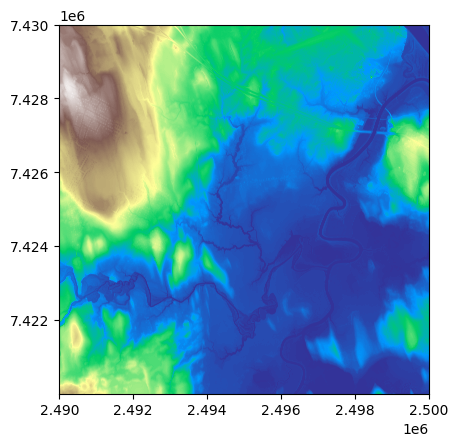

In [ ]:
plot_raster_file('DEM_Data/1_nb_DEM.tif')

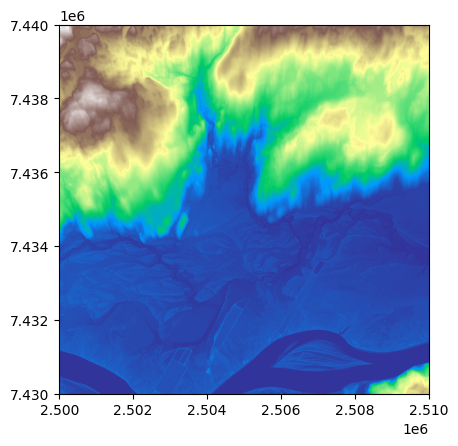

In [ ]:
plot_raster_file('DEM_Data/2_nb_DEM.tif')

Combining the Raster files

In [ ]:
# List of raster files to combine
path = "DEM_Data"
files = get_file_list(path, '.tif')

# Open each raster file
src_files_to_mosaic = []
for file in files:
    src = rasterio.open(file)
    src_files_to_mosaic.append(src)

# Merge the rasters
mosaic, out_trans = merge(src_files_to_mosaic)

# Save the merged raster to file
with rasterio.open('DEM_Data/DEM_NB.tif', 'w', driver='GTiff', width=mosaic.shape[2], height=mosaic.shape[1], 
                   count=1, dtype=mosaic.dtype, crs=src.crs, transform=out_trans) as dst:
    dst.write(mosaic)

# Close the raster files
for src in src_files_to_mosaic:
    src.close()

Compress the Raster file

In [ ]:
compress_tiff_file('DEM_Data/DEM_NB.tif', 'DEM_Data/DEM_NB_Compressed.tif')

Transform the raster file to EPSG: 2953

In [ ]:
# Define the out crs
out_crs = 'EPSG:2953'
# Opening the tif file
ds = gdal.Open('DEM_Data/DEM_NB_Compressed.tif')
# Converting the raster file to the out_Crs
out_raster = gdal.Warp('DEM_Data/DEM_NB_2.tif', ds, dstSRS=out_crs)

Compress the Transformed Raster file

In [ ]:
compress_tiff_file('DEM_Data/DEM_NB_2.tif', 'DEM_Data/FINAL_DEM_NB.tif')

Get the Bounding box(Study Area) from FINAL_DEM_NB file

In [ ]:
# Returns the bounding box and prints it
xmin_STUDY_AREA,ymax_STUDY_AREA,xmax_STUDY_AREA,ymin_STUDY_AREA = get_bounding_box('DEM_Data/FINAL_DEM_NB.tif')
print(f"Bounding box: ({xmin_STUDY_AREA }, {ymin_STUDY_AREA }, {xmax_STUDY_AREA }, {ymax_STUDY_AREA })")

Bounding box: (2489999.0001220703, 7420000.0, 2510000.0001220703, 7440000.0)


#### DERIVATES OF DEM: SLOPE, ASPECT AND ELEVATION

In order to improve the accuracy of flood prediction models, we need to consider additional factors beyond just the elevation data. By deriving slope and aspect data from the digital elevation model (DEM), we can gain a more detailed understanding of the topography of an area, which can affect how water flows and accumulates. This code is extracting slope and aspect data from the DEM using the gdal package, and then aggregating the data by a factor of 128 to reduce the computational load. The resulting data is then saved as a GeoDataFrame in a GeoJSON file for use in our flood prediction model.

In [ ]:
# Open the DEM TIFF file
ds = gdal.Open('DEM_Data/FINAL_DEM_NB.tif')

# Get the geotransform and projection information
geotransform = ds.GetGeoTransform()
projection = ds.GetProjection()

# Read the DEM data as a numpy array
dem_array = ds.GetRasterBand(1).ReadAsArray()

# Calculate the aspect data using gdaldem
options = gdal.DEMProcessingOptions(computeEdges=True)
aspect_ds = gdal.DEMProcessing('DEM_Data/ASPECT.tif', ds, 'aspect', options=options)
slope_ds = gdal.DEMProcessing('DEM_Data/SLOPE.tif', ds, 'slope', options=options)

slope_array = slope_ds.GetRasterBand(1).ReadAsArray()
aspect_array = aspect_ds.GetRasterBand(1).ReadAsArray()

# Aggregate the aspect & slope data by a factor of 128
aspect_array_agg = block_reduce(aspect_array, block_size=(128, 128), func=np.mean)
slope_array_agg = block_reduce(slope_array, block_size=(128, 128), func=np.mean)
elevation_array_agg =  block_reduce(dem_array, block_size=(128, 128), func=np.mean)

# Calculate the x and y coordinates of the aggregated pixels
x_coords_agg = np.arange(aspect_array_agg.shape[1]) * geotransform[1] * 128 + geotransform[0]
y_coords_agg = np.arange(aspect_array_agg.shape[0]) * geotransform[5] * 128 + geotransform[3]

# Create a meshgrid of the x and y coordinates
x_mesh_agg, y_mesh_agg = np.meshgrid(x_coords_agg, y_coords_agg)

# Create a list of polygons representing the aggregated pixels
polygons_agg = [box(x1, y1, x2, y2) for x1, y1, x2, y2 in zip(x_mesh_agg.flatten(), y_mesh_agg.flatten(),\
                                                              x_mesh_agg.flatten() + geotransform[1]*128, y_mesh_agg.flatten() + geotransform[5]*128)]

# Create a GeoDataFrame from the polygons and the aggregated aspect data
gdf = gpd.GeoDataFrame({'aspect': aspect_array_agg.flatten(),'slope':slope_array_agg.flatten(),'elevation':elevation_array_agg.flatten()},\
                       geometry=polygons_agg, crs=ds.GetProjection())

# Save the GeoDataFrame as a file
gdf.to_file('DEM_Data/DERIVATES_NB.geojson', driver='GeoJSON')

In [ ]:
DERIVATES_NB = gdf
# Display the df
DERIVATES_NB

,aspect,slope,elevation,geometry
0,NaN,NaN,-inf,"POLYGON ((2490127.000 7440000.000, 2490127.000..."
1,NaN,NaN,-inf,"POLYGON ((2490255.000 7440000.000, 2490255.000..."
2,NaN,NaN,-inf,"POLYGON ((2490383.000 7440000.000, 2490383.000..."
3,NaN,NaN,-inf,"POLYGON ((2490511.000 7440000.000, 2490511.000..."
4,NaN,NaN,-inf,"POLYGON ((2490639.000 7440000.000, 2490639.000..."
...,...,...,...,...
24644,-2499.750000,0.0,0.0,"POLYGON ((2509583.000 7420032.000, 2509583.000..."
24645,-2499.750000,0.0,0.0,"POLYGON ((2509711.000 7420032.000, 2509711.000..."
24646,-2499.750000,0.0,0.0,"POLYGON ((2509839.000 7420032.000, 2509839.000..."
24647,-2499.750000,0.0,0.0,"POLYGON ((2509967.000 7420032.000, 2509967.000..."


#### PROCESSING THE DERIVATES_NB DATAFRAME

`copy()` method is used here to create a new and independent DataFrame from the filtered subset of DERIVATES_NB, allowing for further operations and modifications without altering the original data.




In [ ]:
# Create a boolean mask to filter out rows with null values
mask = DERIVATES_NB['slope'].notnull() & DERIVATES_NB['aspect'].notnull() & DERIVATES_NB['elevation'].notnull()
# Creating a copy
DERIVATES_NB= DERIVATES_NB[mask].copy()
# Saves the file
DERIVATES_NB.to_file('DEM_Data/DERIVATES_NB.geojson')

# Displays the df
DERIVATES_NB

,aspect,slope,elevation,geometry
79,166.438568,4.215662,64.121132,"POLYGON ((2500239.000 7440000.000, 2500239.000..."
80,98.797508,6.000659,59.218567,"POLYGON ((2500367.000 7440000.000, 2500367.000..."
81,151.075134,4.420215,52.312675,"POLYGON ((2500495.000 7440000.000, 2500495.000..."
82,193.706650,3.458225,51.842499,"POLYGON ((2500623.000 7440000.000, 2500623.000..."
83,190.203842,3.426736,53.214005,"POLYGON ((2500751.000 7440000.000, 2500751.000..."
...,...,...,...,...
24644,-2499.750000,0.000000,0.000000,"POLYGON ((2509583.000 7420032.000, 2509583.000..."
24645,-2499.750000,0.000000,0.000000,"POLYGON ((2509711.000 7420032.000, 2509711.000..."
24646,-2499.750000,0.000000,0.000000,"POLYGON ((2509839.000 7420032.000, 2509839.000..."
24647,-2499.750000,0.000000,0.000000,"POLYGON ((2509967.000 7420032.000, 2509967.000..."


### 2. PRECIPITATION

I am accessing the weather data API provided by the Government of Canada to retrieve precipitation data for New Brunswick province. The API request is made using the requests library in Python, specifying the necessary parameters such as the data format, language, and limit. The response is received in JSON format, which is then converted to a pandas DataFrame using the json_normalize function. The resulting DataFrame is then converted to a GeoDataFrame using the GeoPandas library, which allows for spatial data analysis. The GeoDataFrame contains point data for each precipitation measurement, with latitude and longitude information. Finally, the resulting GeoDataFrame is checked to ensure that the data has been successfully extracted and formatted for further analysis.

---

#### **Source:** [GeoMet-OGC-API](api.weather.gc.ca)
#### **CRS Projection:** 4326
#### **Format:** JSON

---

#### **Why Selected:**
I selected precipitation data as an independent variable for flood prediction for several reasons. Precipitation is a major driver of flooding, and understanding the patterns and intensity of rainfall in an area is critical for predicting flood events. By including precipitation data in our model, we aim to capture the relationship between rainfall and flooding and improve the accuracy of our predictions.

Precipitation data can be obtained from a variety of sources, including weather stations, radar, and satellite imagery. It can be processed using statistical and spatial analysis techniques to generate information on rainfall amounts, intensity, and frequency. By selecting this variable, I aim to account for the impact of precipitation on flood risk and to create a more comprehensive and accurate flood prediction model.

In [ ]:
# Make the API request
url = "https://api.weather.gc.ca/collections/ltce-precipitation/items"
params = {
    "f": "json",
    "lang": "en-CA",
    "limit": 10000,
    "PROVINCE_CODE": "NB"
}
headers = {
    "accept": "application/geo+json"
}

# Returns the response
response = requests.get(url, params=params, headers=headers)

# Convert the JSON response to a pandas DataFrame
json_data = response.json()
df = pd.json_normalize(json_data, "features")
df = df.rename(columns={'geometry.coordinates':'geometry'})
# Convert the DataFrame to a GeoDataFrame
gdf = gpd.GeoDataFrame(
    df, 
    crs="EPSG:4326", 
    geometry=gpd.points_from_xy(df.geometry.str[0], df.geometry.str[1])
)

# Check the resulting GeoDataFrame
gdf.head()

,id,type,geometry,geometry.type,properties.WXO_CITY_CODE,properties.VIRTUAL_STATION_NAME_E,properties.VIRTUAL_STATION_NAME_F,properties.VIRTUAL_CLIMATE_ID,properties.LOCAL_MONTH,properties.LOCAL_DAY,...,properties.THIRD_PRECIPITATION,properties.THIRD_PRECIPITATION_YEAR,properties.FOURTH_PRECIPITATION,properties.FOURTH_PRECIPITATION_YEAR,properties.FIFTH_PRECIPITATION,properties.FIFTH_PRECIPITATION_YEAR,properties.PROVINCE_CODE,properties.RECORD_BEGIN,properties.RECORD_END,properties.IDENTIFIER
0,VSNB1VV-3-4,Feature,POINT (-64.74000 46.47000),Point,NB-1,BOUCTOUCHE AREA,BOUCTOUCHE,VSNB1VV,3,4,...,18.3,1978,17.6,1991,11.0,2020,NB,1965-10-15T00:00:00Z,2021-10-03T00:00:00Z,VSNB1VV-3-4
1,VSNB1VV-7-15,Feature,POINT (-64.74000 46.47000),Point,NB-1,BOUCTOUCHE AREA,BOUCTOUCHE,VSNB1VV,7,15,...,11.0,1993,9.4,1996,8.7,2004,NB,1965-10-15T00:00:00Z,2021-10-03T00:00:00Z,VSNB1VV-7-15
2,VSNB1VV-8-17,Feature,POINT (-64.74000 46.47000),Point,NB-1,BOUCTOUCHE AREA,BOUCTOUCHE,VSNB1VV,8,17,...,13.3,2014,12.8,1998,10.4,1982,NB,1965-10-15T00:00:00Z,2021-10-03T00:00:00Z,VSNB1VV-8-17
3,VSNB1VV-12-29,Feature,POINT (-64.74000 46.47000),Point,NB-1,BOUCTOUCHE AREA,BOUCTOUCHE,VSNB1VV,12,29,...,11.9,1976,11.2,1966,10.6,1996,NB,1965-10-15T00:00:00Z,2021-10-03T00:00:00Z,VSNB1VV-12-29
4,VSNB11V-2-17,Feature,POINT (-66.48000 45.84000),Point,NB-11,OROMOCTO AREA,OROMOCTO,VSNB11V,2,17,...,23.4,1877,22.9,1909,20.3,1903,NB,1871-12-01T00:00:00Z,None,VSNB11V-2-17




---


The CRS of the GeoDataFrame is reprojected to EPSG:2953, which is the New Brunswick Stereographic projection, using the `to_crs()` method. This step ensures that the precipitation data is projected in the same coordinate system as the DEM data for further analysis.


---



In [ ]:
# Transforming the crs of the gdf and printing it
PRECIPITATION_NB = gdf.to_crs(2953)
PRECIPITATION_NB

,id,type,geometry,geometry.type,properties.WXO_CITY_CODE,properties.VIRTUAL_STATION_NAME_E,properties.VIRTUAL_STATION_NAME_F,properties.VIRTUAL_CLIMATE_ID,properties.LOCAL_MONTH,properties.LOCAL_DAY,...,properties.THIRD_PRECIPITATION,properties.THIRD_PRECIPITATION_YEAR,properties.FOURTH_PRECIPITATION,properties.FOURTH_PRECIPITATION_YEAR,properties.FIFTH_PRECIPITATION,properties.FIFTH_PRECIPITATION_YEAR,properties.PROVINCE_CODE,properties.RECORD_BEGIN,properties.RECORD_END,properties.IDENTIFIER
0,VSNB1VV-3-4,Feature,POINT (2635158.349 7498169.942),Point,NB-1,BOUCTOUCHE AREA,BOUCTOUCHE,VSNB1VV,3,4,...,18.3,1978,17.6,1991,11.0,2020,NB,1965-10-15T00:00:00Z,2021-10-03T00:00:00Z,VSNB1VV-3-4
1,VSNB1VV-7-15,Feature,POINT (2635158.349 7498169.942),Point,NB-1,BOUCTOUCHE AREA,BOUCTOUCHE,VSNB1VV,7,15,...,11.0,1993,9.4,1996,8.7,2004,NB,1965-10-15T00:00:00Z,2021-10-03T00:00:00Z,VSNB1VV-7-15
2,VSNB1VV-8-17,Feature,POINT (2635158.349 7498169.942),Point,NB-1,BOUCTOUCHE AREA,BOUCTOUCHE,VSNB1VV,8,17,...,13.3,2014,12.8,1998,10.4,1982,NB,1965-10-15T00:00:00Z,2021-10-03T00:00:00Z,VSNB1VV-8-17
3,VSNB1VV-12-29,Feature,POINT (2635158.349 7498169.942),Point,NB-1,BOUCTOUCHE AREA,BOUCTOUCHE,VSNB1VV,12,29,...,11.9,1976,11.2,1966,10.6,1996,NB,1965-10-15T00:00:00Z,2021-10-03T00:00:00Z,VSNB1VV-12-29
4,VSNB11V-2-17,Feature,POINT (2501553.568 7426642.735),Point,NB-11,OROMOCTO AREA,OROMOCTO,VSNB11V,2,17,...,23.4,1877,22.9,1909,20.3,1903,NB,1871-12-01T00:00:00Z,None,VSNB11V-2-17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,VSNB11V-3-11,Feature,POINT (2501553.568 7426642.735),Point,NB-11,OROMOCTO AREA,OROMOCTO,VSNB11V,3,11,...,23.8,1979,22.9,1918,19.8,1971,NB,1871-12-01T00:00:00Z,None,VSNB11V-3-11
9996,VSNB11V-5-21,Feature,POINT (2501553.568 7426642.735),Point,NB-11,OROMOCTO AREA,OROMOCTO,VSNB11V,5,21,...,36.3,1973,34.5,1881,33.3,2023,NB,1871-12-01T00:00:00Z,None,VSNB11V-5-21
9997,VSNB11V-9-8,Feature,POINT (2501553.568 7426642.735),Point,NB-11,OROMOCTO AREA,OROMOCTO,VSNB11V,9,8,...,39.4,1891,23.9,1943,19.6,1919,NB,1871-12-01T00:00:00Z,None,VSNB11V-9-8
9998,VSNB11V-11-29,Feature,POINT (2501553.568 7426642.735),Point,NB-11,OROMOCTO AREA,OROMOCTO,VSNB11V,11,29,...,31.8,1968,27.2,1872,22.9,1957,NB,1871-12-01T00:00:00Z,None,VSNB11V-11-29


In [ ]:
# Saving it to geojson file
PRECIPITATION_NB.to_file('PRECIPITATION_RAW.geojson')

Information regarding the PRECIPITATION DATASET

In [ ]:
# Displays the info of the df
PRECIPITATION_NB.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 28 columns):
 #   Column                                   Non-Null Count  Dtype   
---  ------                                   --------------  -----   
 0   id                                       10000 non-null  object  
 1   type                                     10000 non-null  object  
 2   geometry                                 10000 non-null  geometry
 3   geometry.type                            10000 non-null  object  
 4   properties.WXO_CITY_CODE                 10000 non-null  object  
 5   properties.VIRTUAL_STATION_NAME_E        10000 non-null  object  
 6   properties.VIRTUAL_STATION_NAME_F        10000 non-null  object  
 7   properties.VIRTUAL_CLIMATE_ID            10000 non-null  object  
 8   properties.LOCAL_MONTH                   10000 non-null  int64   
 9   properties.LOCAL_DAY                     10000 non-null  int64   
 10  properties.RECORD_PRECIPITA

#### PROCESSING PRECIPITATION DATASET

By applying the study area extent using the cx method, we are clipping the precipitation data to only include the area we are interested in analyzing. This helps to reduce the size of the dataset and focuses the analysis on the specific area of interest, making it more efficient and accurate.

In [ ]:
# Extract the subset within the study area as defined 
PRECIPITATION_NB = PRECIPITATION_NB.cx[xmin_STUDY_AREA:xmax_STUDY_AREA, ymin_STUDY_AREA:ymax_STUDY_AREA]

In this code, we are selecting only the relevant columns from the PRECIPITATION_NB GeoDataFrame. The columns we are keeping are geometry, which contains the point location of the precipitation data, and various columns related to precipitation values. By keeping only the necessary columns, we reduce the memory footprint of the GeoDataFrame and make it easier to work with in subsequent analysis steps.

In [ ]:
# Select specific columns to keep
cols_to_keep = ['geometry', 'properties.RECORD_PRECIPITATION', 'properties.PREV_RECORD_PRECIPITATION','properties.FIRST_PRECIPITATION',\
              'properties.SECOND_PRECIPITATION', 'properties.THIRD_PRECIPITATION', 'properties.FOURTH_PRECIPITATION', 'properties.FIFTH_PRECIPITATION']
PRECIPITATION_NB = PRECIPITATION_NB[cols_to_keep]

A buffer of 2000 meters is added around each point in the geometry column of the PRECIPITATION_NB GeoDataFrame. This is done in order to incorporate the area around each point, rather than just the point itself, when performing spatial operations. In the context of this project, the buffer is added to ensure that the precipitation measurements around each point are captured in the analysis, rather than just at the exact point location.

In [ ]:
# Buffer the geometry column by 2000 units
PRECIPITATION_NB.geometry = PRECIPITATION_NB.geometry.buffer(2000)

In [ ]:
# Displays the top 5 rows
PRECIPITATION_NB.head()

,geometry,properties.RECORD_PRECIPITATION,properties.PREV_RECORD_PRECIPITATION,properties.FIRST_PRECIPITATION,properties.SECOND_PRECIPITATION,properties.THIRD_PRECIPITATION,properties.FOURTH_PRECIPITATION,properties.FIFTH_PRECIPITATION
4,"POLYGON ((2503553.568 7426642.735, 2503543.938...",27.9,23.4,27.9,24.4,23.4,22.9,20.3
5,"POLYGON ((2503553.568 7426642.735, 2503543.938...",39.1,30.5,39.1,30.5,30.0,28.7,25.4
110,"POLYGON ((2503553.568 7426642.735, 2503543.938...",47.5,40.4,47.5,40.4,39.6,29.2,29.0
193,"POLYGON ((2503553.568 7426642.735, 2503543.938...",71.1,19.1,71.1,19.8,19.1,18.0,15.2
283,"POLYGON ((2503553.568 7426642.735, 2503543.938...",44.7,27.9,44.7,27.9,17.8,15.5,12.2


In [ ]:
# Saving it to a geojson file
PRECIPITATION_NB.to_file('PRECIPITATION_NB.geojson')

### 3. LAND COVER DATA

The landcover dataset was downloaded from the National Ecological Framework for Canada website as a GeoJSON file. The file contained polygons representing different ecological regions in Canada. The data was in the WGS84 CRS and had a resolution of 1 meter per pixel. To use this dataset for analysis, it was first preprocessed to extract the required data such as landcover type and region. The GeoJSON file was converted to a GeoDataFrame using the GeoPandas library. The resulting GeoDataFrame was then reprojected to a common projection and the unnecessary columns were dropped to create a smaller, more manageable dataset. Finally, the resulting GeoDataFrame was clipped to the study area of interest to reduce the dataset size and focus the analysis on the relevant regions.

I choose this dataset to provide information on land cover classes in our study area, which can be used to better understand the impact of land use and land cover changes on flood predicition

---

#### **Source:** [Agriculture Canada](https://agriculture.canada.ca/)
#### **CRS Projection:** EPSG:4326
#### **Format:** GeoJSON

---

#### **Why Selected:**
I selected landcover data as an independent variable for flood prediction for several reasons. Landcover provides information on the type and distribution of vegetation, buildings, and other land uses in an area, which can affect water infiltration and runoff. For example, areas with high amounts of impervious surfaces, such as pavement or buildings, can lead to increased runoff and reduced infiltration, which can increase flood risk. On the other hand, areas with dense vegetation can absorb more water and reduce runoff.

Landcover data can be obtained from satellite imagery and processed using remote sensing techniques to classify land into different categories, such as urban, forested, agricultural, or water bodies. This data can be used to create maps that provide detailed information on land use and land cover changes over time. By including this information as an independent variable in our flood prediction model, we aim to capture the impact of land use and land cover on flooding and improve the accuracy of our predictions

In [ ]:
# Download the file from admin_zones_url and save it as a geojson file
admin_zones_url = 'https://agriculture.canada.ca/atlas/data_donnees/nationalEcologicalFramework/data_donnees/geoJSON/er/nef_ecoreg_landcover.geojson'
_, msg = urllib.request.urlretrieve(admin_zones_url, 'nef_ecoreg_landcover.geojson')

In [ ]:
# Read the GeoJSON file into a GeoDataFrame 
file_path = "nef_ecoreg_landcover.geojson"
data_landcover = gpd.read_file(file_path)

In [ ]:
# Display the CRS
data_landcover.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [ ]:
# Display information about the data structure and columns
data_landcover.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 761 entries, 0 to 760
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   OBJECTID_1         761 non-null    int64   
 1   OBJECTID           761 non-null    int64   
 2   COMPONENT_NUM      761 non-null    int64   
 3   LANDCOVER_PERCENT  761 non-null    int64   
 4   ECOREGION_ID       761 non-null    int64   
 5   LANDCOVER_CODE     761 non-null    int64   
 6   DESCRIPTION_EN     761 non-null    object  
 7   DESCRIPTION_FR     761 non-null    object  
 8   SHAPE_Length       761 non-null    float64 
 9   SHAPE_Area         761 non-null    float64 
 10  geometry           761 non-null    geometry
dtypes: float64(2), geometry(1), int64(6), object(2)
memory usage: 65.5+ KB


#### PROCESSING/CLEANING LANDCOVER DATASET

In the given code, we first reproject the landcover data to the NAD83(CSRS) UTM zone 19N projection using the to_crs() method. Next, we apply a spatial filter using the cx() method to extract only the portion of the data that falls within the study area. The resulting GeoDataFrame contains only the landcover data that is relevant to our analysis.

In [ ]:
# Transform the CRS to EPSG 2953
data_landcover = data_landcover.to_crs(2953) 
# Extract the subset of data_landcover within the study area as defined 
data_landcover = data_landcover.cx[xmin_STUDY_AREA:xmax_STUDY_AREA, ymin_STUDY_AREA:ymax_STUDY_AREA]
# Display the df
data_landcover

,OBJECTID_1,OBJECTID,COMPONENT_NUM,LANDCOVER_PERCENT,ECOREGION_ID,LANDCOVER_CODE,DESCRIPTION_EN,DESCRIPTION_FR,SHAPE_Length,SHAPE_Area,geometry
583,718,13,4,5,122,9,Cropland: cultivated land,Terre en culture : terres cultivées\r\n,2.399401e+06,8.268971e+10,"POLYGON ((2644423.682 7582178.520, 2644497.844..."
584,719,14,5,3,122,7,Sparsely Vegetated/Barren Land: plant cover ge...,Végétation clairsemée/terre stérile : zone où ...,2.399401e+06,8.268971e+10,"POLYGON ((2644423.682 7582178.520, 2644497.844..."
585,720,250,1,53,122,1,Mixed Forest: canopy 26-75% coniferous/broadle...,Forêt mixte : voûte d'arbres composée de résin...,2.399401e+06,8.268971e+10,"POLYGON ((2644423.682 7582178.520, 2644497.844..."
586,721,251,2,32,122,5,Coniferous Forest: canopy >75% coniferous trees,Forêt résineuse : voûte d'arbres composée de r...,2.399401e+06,8.268971e+10,"POLYGON ((2644423.682 7582178.520, 2644497.844..."
587,722,252,3,7,122,2,Broadleaf Forest: canopy >75% broadleaf trees,Forêt feuillue : voûte d'arbres composée de fe...,2.399401e+06,8.268971e+10,"POLYGON ((2644423.682 7582178.520, 2644497.844..."


In [ ]:
# Select specific columns to keep
cols_to_keep = ['LANDCOVER_PERCENT', 'LANDCOVER_CODE', 'DESCRIPTION_EN','geometry']
data_landcover = data_landcover[cols_to_keep]

# Display the df
data_landcover

,LANDCOVER_PERCENT,LANDCOVER_CODE,DESCRIPTION_EN,geometry
583,5,9,Cropland: cultivated land,"POLYGON ((2644423.682 7582178.520, 2644497.844..."
584,3,7,Sparsely Vegetated/Barren Land: plant cover ge...,"POLYGON ((2644423.682 7582178.520, 2644497.844..."
585,53,1,Mixed Forest: canopy 26-75% coniferous/broadle...,"POLYGON ((2644423.682 7582178.520, 2644497.844..."
586,32,5,Coniferous Forest: canopy >75% coniferous trees,"POLYGON ((2644423.682 7582178.520, 2644497.844..."
587,7,2,Broadleaf Forest: canopy >75% broadleaf trees,"POLYGON ((2644423.682 7582178.520, 2644497.844..."


In [ ]:
# Save the dataframe as a geojson
data_landcover.to_file('LANDCOVER_NB.geojson')

#### DERIVATES OF DEM: SLOPE, ASPECT AND ELEVATION

In [ ]:
# Open the DEM TIFF file
ds = gdal.Open('DEM_Data/FINAL_DEM_NB.tif')

# Get the geotransform and projection information
geotransform = ds.GetGeoTransform()
projection = ds.GetProjection()

# Read the DEM data as a numpy array
dem_array = ds.GetRasterBand(1).ReadAsArray()

# Calculate the aspect data using gdaldem
options = gdal.DEMProcessingOptions(computeEdges=True)
aspect_ds = gdal.DEMProcessing('DEM_Data/ASPECT.tif', ds, 'aspect', options=options)
slope_ds = gdal.DEMProcessing('DEM_Data/SLOPE.tif', ds, 'slope', options=options)

# Read the data from the first band of the slope and aspect dataset into an array
slope_array = slope_ds.GetRasterBand(1).ReadAsArray()
aspect_array = aspect_ds.GetRasterBand(1).ReadAsArray()

# Aggregate the aspect & slope data by a factor of 128
aspect_array_agg = block_reduce(aspect_array, block_size=(128, 128), func=np.mean)
slope_array_agg = block_reduce(slope_array, block_size=(128, 128), func=np.mean)
elevation_array_agg =  block_reduce(dem_array, block_size=(128, 128), func=np.mean)

# Calculate the x and y coordinates of the aggregated pixels
x_coords_agg = np.arange(aspect_array_agg.shape[1]) * geotransform[1] * 128 + geotransform[0]
y_coords_agg = np.arange(aspect_array_agg.shape[0]) * geotransform[5] * 128 + geotransform[3]

# Create a meshgrid of the x and y coordinates
x_mesh_agg, y_mesh_agg = np.meshgrid(x_coords_agg, y_coords_agg)

# Create a list of polygons representing the aggregated pixels
polygons_agg = [box(x1, y1, x2, y2) for x1, y1, x2, y2 in zip(x_mesh_agg.flatten(), y_mesh_agg.flatten(), x_mesh_agg.flatten() + geotransform[1]*128, y_mesh_agg.flatten() + geotransform[5]*128)]

# Create a GeoDataFrame from the polygons and the aggregated aspect data
gdf = gpd.GeoDataFrame({'aspect': aspect_array_agg.flatten(),'slope':slope_array_agg.flatten(),'elevation':elevation_array_agg.flatten()}, geometry=polygons_agg, crs=ds.GetProjection())

# Save the GeoDataFrame as a file
gdf.to_file('DEM_Data/DERIVATES_NB.geojson', driver='GeoJSON')


In [ ]:
# Assign the gdf to a variable and display the contents
DERIVATES_NB = gdf
DERIVATES_NB

,aspect,slope,elevation,geometry
0,NaN,NaN,-inf,"POLYGON ((2490127.000 7440000.000, 2490127.000..."
1,NaN,NaN,-inf,"POLYGON ((2490255.000 7440000.000, 2490255.000..."
2,NaN,NaN,-inf,"POLYGON ((2490383.000 7440000.000, 2490383.000..."
3,NaN,NaN,-inf,"POLYGON ((2490511.000 7440000.000, 2490511.000..."
4,NaN,NaN,-inf,"POLYGON ((2490639.000 7440000.000, 2490639.000..."
...,...,...,...,...
24644,-2499.750000,0.0,0.0,"POLYGON ((2509583.000 7420032.000, 2509583.000..."
24645,-2499.750000,0.0,0.0,"POLYGON ((2509711.000 7420032.000, 2509711.000..."
24646,-2499.750000,0.0,0.0,"POLYGON ((2509839.000 7420032.000, 2509839.000..."
24647,-2499.750000,0.0,0.0,"POLYGON ((2509967.000 7420032.000, 2509967.000..."


#### PROCESSING THE DERIVATES_NB DATAFRAME






In [ ]:
# Create a boolean mask to filter out rows with null values
mask = DERIVATES_NB['slope'].notnull() & DERIVATES_NB['aspect'].notnull() & DERIVATES_NB['elevation'].notnull()

# Apply the mask to DERIVATES_NB to keep only the rows that satisfy the condition
DERIVATES_NB= DERIVATES_NB[mask].copy()

# Save DERIVATES_NB as a GeoJSON file
DERIVATES_NB.to_file('DEM_Data/DERIVATES_NB.geojson')

# Display the dataframe
DERIVATES_NB

,aspect,slope,elevation,geometry
79,166.438568,4.215662,64.121132,"POLYGON ((2500239.000 7440000.000, 2500239.000..."
80,98.797508,6.000659,59.218567,"POLYGON ((2500367.000 7440000.000, 2500367.000..."
81,151.075134,4.420215,52.312675,"POLYGON ((2500495.000 7440000.000, 2500495.000..."
82,193.706650,3.458225,51.842499,"POLYGON ((2500623.000 7440000.000, 2500623.000..."
83,190.203842,3.426736,53.214005,"POLYGON ((2500751.000 7440000.000, 2500751.000..."
...,...,...,...,...
24644,-2499.750000,0.000000,0.000000,"POLYGON ((2509583.000 7420032.000, 2509583.000..."
24645,-2499.750000,0.000000,0.000000,"POLYGON ((2509711.000 7420032.000, 2509711.000..."
24646,-2499.750000,0.000000,0.000000,"POLYGON ((2509839.000 7420032.000, 2509839.000..."
24647,-2499.750000,0.000000,0.000000,"POLYGON ((2509967.000 7420032.000, 2509967.000..."


In [ ]:
# Apply the mask to DERIVATES_NB to keep only the rows that satisfy the condition
DERIVATES_NB = DERIVATES_NB[mask].copy()

# Save DERIVATES_NB as a GeoJSON file
DERIVATES_NB.to_file('DEM_Data/DERIVATES_NB.geojson')

# Display DERIVATES_NB
DERIVATES_NB


,aspect,slope,elevation,geometry
79,166.438568,4.215662,64.121132,"POLYGON ((2500239.000 7440000.000, 2500239.000..."
80,98.797508,6.000659,59.218567,"POLYGON ((2500367.000 7440000.000, 2500367.000..."
81,151.075134,4.420215,52.312675,"POLYGON ((2500495.000 7440000.000, 2500495.000..."
82,193.706650,3.458225,51.842499,"POLYGON ((2500623.000 7440000.000, 2500623.000..."
83,190.203842,3.426736,53.214005,"POLYGON ((2500751.000 7440000.000, 2500751.000..."
...,...,...,...,...
24644,-2499.750000,0.000000,0.000000,"POLYGON ((2509583.000 7420032.000, 2509583.000..."
24645,-2499.750000,0.000000,0.000000,"POLYGON ((2509711.000 7420032.000, 2509711.000..."
24646,-2499.750000,0.000000,0.000000,"POLYGON ((2509839.000 7420032.000, 2509839.000..."
24647,-2499.750000,0.000000,0.000000,"POLYGON ((2509967.000 7420032.000, 2509967.000..."


### 4. EXTRACTING NON FLOOD DATA AND PLOTTING FLOOD AND NON FLOOD EVENTS

#### NON FLOOD DATA

To create a GeoDataFrame for the non-flooded areas within a study area:
1. A bounding box is defined based on the coordinates of the study area using 
the xmin_STUDY_AREA, ymin_STUDY_AREA, xmax_STUDY_AREA, and ymax_STUDY_AREA variables. This bounding box is then converted to a GeoDataFrame with a single polygon geometry using the box function from the Shapely library. The coordinate reference system of the bounding box is set to EPSG code 2953.
2. Next, the FLOOD_DATA_NB GeoDataFrame is copied to create a new GeoDataFrame called non_flood_data. The geometry column of non_flood_data is set to the difference between the bounding box polygon and the union of all geometries in the FLOOD_DATA_NB GeoDataFrame. This effectively removes any flooded areas from the study area. The `buffer(0)` method is called to ensure the resulting geometries are valid.
3. Finally, a new column called flood is added to the non_flood_data GeoDataFrame with a default value of `0`. This column will be used to indicate whether each geometry intersects with flooded areas or not.

In [ ]:
# Read the data from geojson file
FLOOD_DATA_NB = gpd.read_file('FLOOD_Data/FLOOD_NB.geojson')

In [ ]:
# Create a bounding box using the study area coordinates
bbox = [xmin_STUDY_AREA,ymin_STUDY_AREA,xmax_STUDY_AREA, ymax_STUDY_AREA]
# Create a GeoDataFrame for the bbox
bbox = gpd.GeoDataFrame(geometry=[box(xmin_STUDY_AREA,ymin_STUDY_AREA,xmax_STUDY_AREA, ymax_STUDY_AREA)], crs=2953)
# Create a copy of FLOOD_DATA_NB for non-flood data
non_flood_data = FLOOD_DATA_NB.copy()
# Compute the difference
non_flood_data.geometry = bbox.difference(FLOOD_DATA_NB.geometry.unary_union).buffer(0)
# Filter out invalid geometries
non_flood_data = non_flood_data[non_flood_data.geometry.is_valid]
# Assign a 'flood' value of 0 to non-flood data
non_flood_data['flood'] = 0
# Display the non-flood data
non_flood_data

,flood,geometry
0,0,MULTIPOLYGON Z (((2510000.000 7420000.000 0.00...


In [ ]:
# Create a Folium map centered on New Brunswick, Canada
m = folium.Map(location=[46.5653, -66.4619], zoom_start=8, tiles='CartoDB positron')

In [ ]:
# Add the Flood_data_trail GeoDataFrame to the map with blue color
folium.GeoJson(non_flood_data, style_function=lambda x: {'fillColor': 'green', 'color': 'green'}).add_to(m)

# Display the map
display(m)

In [ ]:
# Save to a geojson file
non_flood_data.to_file('FLOOD_Data/NON_FLOOD_NB.geojson')

### 5. COMBINING DATASETS

**Sometimes, when working with large datasets or complex computations in Google Colab, the runtime may crash or become unresponsive. In order to continue working on the notebook, it may be necessary to restart the runtime. However, this can cause previously loaded data to be lost and require reloading the data from the original source. To avoid this issue, I have saved my processed datasets in GeoJSON format so that they can be easily reloaded and continue with the analysis. Each time the runtime is restarted, I simply reload the GeoJSON files to continue the analysis from where I left off. This helps to save time and avoid having to reprocess large datasets multiple times.**

In [ ]:
# Read in the independent datasets
dem_data = gpd.read_file('DEM_Data/DERIVATES_NB.geojson')
dem_data = dem_data.to_crs(2953)

land_cover_data = gpd.read_file('LANDCOVER_NB.geojson')
land_cover_data = land_cover_data.to_crs(2953)

precipitation_data = gpd.read_file('PRECIPITATION_NB.geojson')
precipitation_data = precipitation_data.to_crs(2953)

# Read in the flood event data
flood_data = gpd.read_file('FLOOD_Data/FLOOD_NB.geojson')

# Read non_flood event data
non_flood_data = gpd.read_file('FLOOD_Data/NON_FLOOD_NB.geojson')
non_flood_data = non_flood_data.to_crs(2953)

CLIPPING THE DATASETS TO THE BBOX

In [ ]:
# Create a GeoDataFrame with a single polygon representing the bounding box of dem_data
bbox = gpd.GeoDataFrame(geometry=[box(*dem_data.total_bounds)], crs=dem_data.crs)

# Clip the datasets to the bbox polygon, retaining only the data within the bounds
dem_data_clipped = gpd.clip(dem_data, bbox)
land_cover_data_clipped = gpd.clip(land_cover_data, bbox)
precipitation_data_clipped = gpd.clip(precipitation_data, bbox)
flood_data_clipped = gpd.clip(flood_data, bbox)

#### FLOOD DATA

##### COMBINING FLOOD DATA WITH DEM DATA

Performing a spatial join to match the flood event data with the DEM DATA

In [ ]:
# Perform a spatial join to match the flood event data with the corresponding independent data
combined_data = gpd.sjoin(flood_data, dem_data_clipped, how='left', op='intersects')
combined_data = combined_data.drop('index_right', 1)
combined_data.head()

,flood,geometry,aspect,slope,elevation
0,1,MULTIPOLYGON Z (((2498072.311 7404147.634 0.00...,-2499.75,0.0,0.0
0,1,MULTIPOLYGON Z (((2498072.311 7404147.634 0.00...,-2499.75,0.0,0.0
0,1,MULTIPOLYGON Z (((2498072.311 7404147.634 0.00...,-2499.75,0.0,0.0
0,1,MULTIPOLYGON Z (((2498072.311 7404147.634 0.00...,-2499.75,0.0,0.0
0,1,MULTIPOLYGON Z (((2498072.311 7404147.634 0.00...,-2499.75,0.0,0.0


##### Sampling the combined data 

When working with a large dataset, it can be computationally expensive to process and analyze the entire dataset at once. In order to reduce the computational load and increase efficiency, we can use a fraction or subset of the data. In this case, a fraction of 0.125 (or 12.5%) of the combined dataset is being used as the sample data.

Using a sample of the data allows us to perform preliminary analysis and exploratory data analysis (EDA) to gain insights into the data without overloading the computational resources. It can also help us to identify potential issues with the data, such as missing or corrupted values, before we apply any processing or modeling.

To ensure that the sample data is representative of the actual data, some plots are created to verify that the distribution of variables in the sample data is similar to the actual data. This helps to ensure that the conclusions drawn from the analysis of the sample data can be generalized to the entire dataset.

In [ ]:
# Randomly sample a fraction of rows from the DataFrame and display the top 5 rows
sample_data = combined_data.sample(frac=0.125)
sample_data.head()

,flood,geometry,aspect,slope,elevation
20,1,MULTIPOLYGON Z (((2523111.426 7358379.174 0.00...,172.522110,2.624872,3.837657
11,1,MULTIPOLYGON Z (((2550846.863 7362906.682 0.00...,178.032913,3.082328,2.205489
0,1,MULTIPOLYGON Z (((2498072.311 7404147.634 0.00...,168.902374,3.518950,3.400087
20,1,MULTIPOLYGON Z (((2523111.426 7358379.174 0.00...,176.323944,3.336102,2.627534
33,1,MULTIPOLYGON Z (((2528000.257 7361452.583 0.00...,-9999.000000,0.000000,0.000000


Checking sample data using scatter plot of elevation vs slope for combined data vs sample data

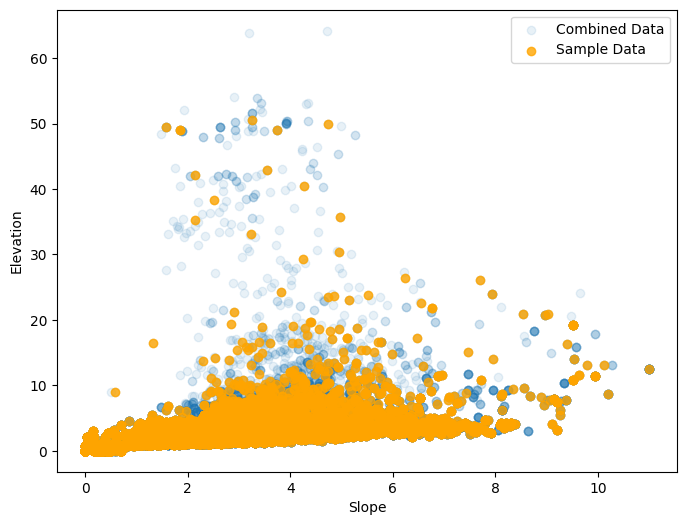

In [ ]:
# Create a scatter plot of elevation vs slope
fig, ax = plt.subplots(figsize=(8,6))
ax.scatter(combined_data['slope'], combined_data['elevation'], alpha=0.1, label='Combined Data')
ax.scatter(sample_data['slope'], sample_data['elevation'], alpha=0.8, color='orange', label='Sample Data')
ax.set_xlabel('Slope')
ax.set_ylabel('Elevation')
ax.legend()
plt.show()

Checking frequency of slope, aspect and elevation for Combined vs Sample

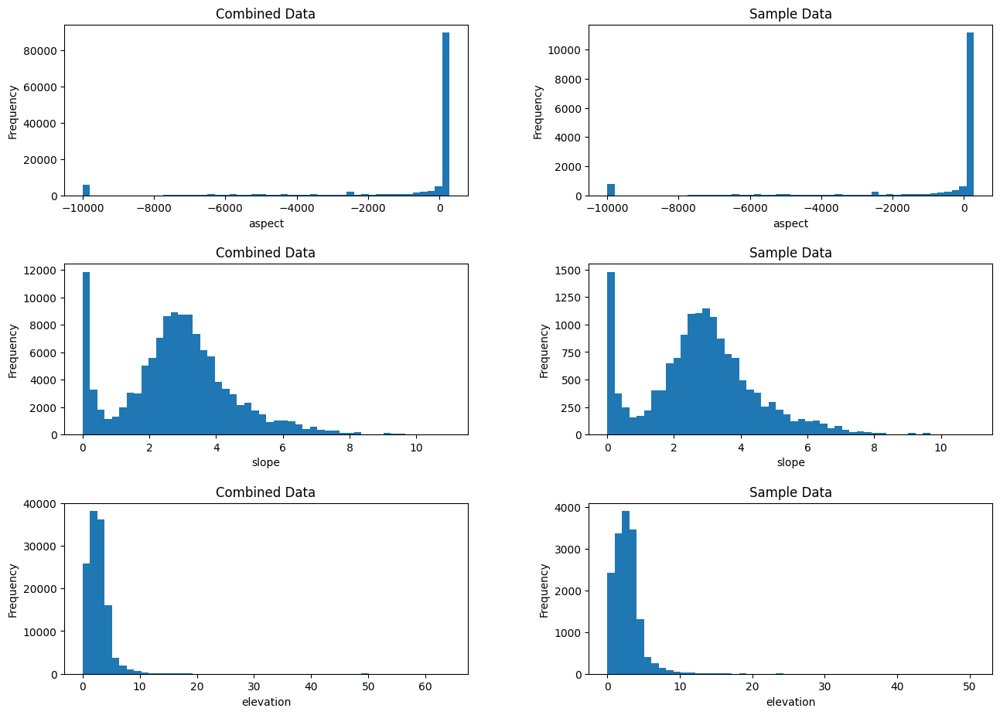

In [ ]:
# Define the columns to analyze
cols = ['aspect', 'slope', 'elevation']

# Create a figure with subplots
fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(15,10))

# Loop over each column
for i, col in enumerate(cols):

    # Plot histogram of combined data
    axs[i][0].hist(combined_data[col], bins=50)
    axs[i][0].set_xlabel(col)
    axs[i][0].set_ylabel('Frequency')
    axs[i][0].set_title('Combined Data')

    # Plot histogram of sample data
    axs[i][1].hist(sample_data[col], bins=50)
    axs[i][1].set_xlabel(col)
    axs[i][1].set_ylabel('Frequency')
    axs[i][1].set_title('Sample Data')

# Adjust the layout and spacing
plt.tight_layout()
plt.subplots_adjust(top=0.92, bottom=0.08, left=0.1, right=0.9, hspace=0.4, wspace=0.3)


##### COMBINING the DEM_FLOOD COMBINED data with LANDCOVER data

Performing a spatial join to match the flood event data with the LANDCOVER data

In [ ]:
# Perform a spatial join based on intersecting geometries
combined_data = gpd.sjoin(sample_data, land_cover_data_clipped, how='left', op='intersects')
# Drop the 'index_right' column from the combined_data DataFrame
combined_data = combined_data.drop('index_right', 1)
# Display the top 5 rows
combined_data.head()

,flood,geometry,aspect,slope,elevation,LANDCOVER_PERCENT,LANDCOVER_CODE,DESCRIPTION_EN
20,1,MULTIPOLYGON Z (((2523111.426 7358379.174 0.00...,172.52211,2.624872,3.837657,5,9,Cropland: cultivated land
20,1,MULTIPOLYGON Z (((2523111.426 7358379.174 0.00...,172.52211,2.624872,3.837657,3,7,Sparsely Vegetated/Barren Land: plant cover ge...
20,1,MULTIPOLYGON Z (((2523111.426 7358379.174 0.00...,172.52211,2.624872,3.837657,53,1,Mixed Forest: canopy 26-75% coniferous/broadle...
20,1,MULTIPOLYGON Z (((2523111.426 7358379.174 0.00...,172.52211,2.624872,3.837657,32,5,Coniferous Forest: canopy >75% coniferous trees
20,1,MULTIPOLYGON Z (((2523111.426 7358379.174 0.00...,172.52211,2.624872,3.837657,7,2,Broadleaf Forest: canopy >75% broadleaf trees


##### Sampling the combined data 

In [ ]:
# Randomly sample a fraction of rows from the DataFrame to create a new sample
sample_data = combined_data.sample(frac=0.25)
# Display the top 5 rows
sample_data.head()

,flood,geometry,aspect,slope,elevation,LANDCOVER_PERCENT,LANDCOVER_CODE,DESCRIPTION_EN
21,1,MULTIPOLYGON Z (((2525036.959 7355722.924 0.00...,179.638641,3.750751,2.756369,32,5,Coniferous Forest: canopy >75% coniferous trees
5,1,MULTIPOLYGON Z (((2547667.882 7355630.369 0.00...,171.060532,4.445396,3.433321,5,9,Cropland: cultivated land
12,1,MULTIPOLYGON Z (((2511630.916 7380578.001 0.00...,176.452301,1.707307,4.094881,3,7,Sparsely Vegetated/Barren Land: plant cover ge...
12,1,MULTIPOLYGON Z (((2511630.916 7380578.001 0.00...,-351.782135,1.467618,0.924932,53,1,Mixed Forest: canopy 26-75% coniferous/broadle...
4,1,MULTIPOLYGON Z (((2546247.516 7354997.163 0.00...,-9999.000000,0.000000,0.000000,7,2,Broadleaf Forest: canopy >75% broadleaf trees


Checking frequency of LANDCOVER_PERCENT and LANDCOVER_CODE for Combined vs Sample

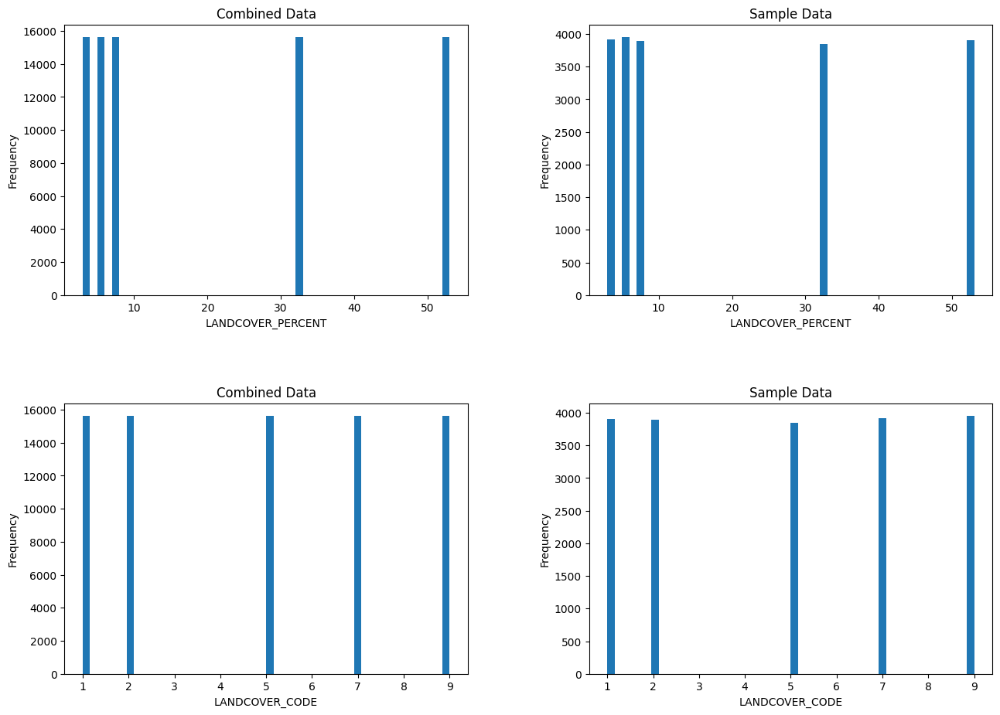

In [ ]:
# Define the columns to analyze
cols = ['LANDCOVER_PERCENT', 'LANDCOVER_CODE']

# Create a figure with subplots
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(15,10))

# Loop over each column
for i, col in enumerate(cols):

    # Plot histogram of combined data
    axs[i][0].hist(combined_data[col], bins=50)
    axs[i][0].set_xlabel(col)
    axs[i][0].set_ylabel('Frequency')
    axs[i][0].set_title('Combined Data')

    # Plot histogram of sample data
    axs[i][1].hist(sample_data[col], bins=50)
    axs[i][1].set_xlabel(col)
    axs[i][1].set_ylabel('Frequency')
    axs[i][1].set_title('Sample Data')

# Adjust the layout and spacing
plt.tight_layout()
plt.subplots_adjust(top=0.92, bottom=0.08, left=0.1, right=0.9, hspace=0.4, wspace=0.3)

##### COMBINING PRECIPITATION DATA WITH REST OF THE COMBINED DATA

Performing a spatial join to match the flood event data with the Precipitation data

In [ ]:
# Perform a spatial join based on intersecting geometries and drop column from the combined df
combined_data = gpd.sjoin(sample_data, precipitation_data_clipped, how='left', op='intersects')
combined_data = combined_data.drop('index_right', 1)
# Display the top 5 rows
combined_data.head()

,flood,geometry,aspect,slope,elevation,LANDCOVER_PERCENT,LANDCOVER_CODE,DESCRIPTION_EN,properties.RECORD_PRECIPITATION,properties.PREV_RECORD_PRECIPITATION,properties.FIRST_PRECIPITATION,properties.SECOND_PRECIPITATION,properties.THIRD_PRECIPITATION,properties.FOURTH_PRECIPITATION,properties.FIFTH_PRECIPITATION
21,1,MULTIPOLYGON Z (((2525036.959 7355722.924 0.00...,179.638641,3.750751,2.756369,32,5,Coniferous Forest: canopy >75% coniferous trees,96.8,9.9,96.8,42.9,36.6,29.5,24.4
21,1,MULTIPOLYGON Z (((2525036.959 7355722.924 0.00...,179.638641,3.750751,2.756369,32,5,Coniferous Forest: canopy >75% coniferous trees,50.8,10.2,50.8,27.4,21.8,20.8,18.8
21,1,MULTIPOLYGON Z (((2525036.959 7355722.924 0.00...,179.638641,3.750751,2.756369,32,5,Coniferous Forest: canopy >75% coniferous trees,35.8,27.2,35.8,27.2,24.8,24.4,22.8
21,1,MULTIPOLYGON Z (((2525036.959 7355722.924 0.00...,179.638641,3.750751,2.756369,32,5,Coniferous Forest: canopy >75% coniferous trees,35.4,27.2,35.4,27.2,23.9,20.3,20.3
21,1,MULTIPOLYGON Z (((2525036.959 7355722.924 0.00...,179.638641,3.750751,2.756369,32,5,Coniferous Forest: canopy >75% coniferous trees,36.3,18.5,36.3,20.8,20.5,19.3,18.5


In [ ]:
# Randomly sample a fraction of rows from the DataFrame to create a new sample
sample_data = combined_data.sample(frac=0.005)
# Display the top 5 rows
sample_data.head()

,flood,geometry,aspect,slope,elevation,LANDCOVER_PERCENT,LANDCOVER_CODE,DESCRIPTION_EN,properties.RECORD_PRECIPITATION,properties.PREV_RECORD_PRECIPITATION,properties.FIRST_PRECIPITATION,properties.SECOND_PRECIPITATION,properties.THIRD_PRECIPITATION,properties.FOURTH_PRECIPITATION,properties.FIFTH_PRECIPITATION
19,1,MULTIPOLYGON Z (((2525002.920 7354660.866 0.00...,-9999.000000,0.000000,0.000000,32,5,Coniferous Forest: canopy >75% coniferous trees,41.7,21.1,41.7,21.1,20.8,17.8,17.3
26,1,MULTIPOLYGON Z (((2470800.715 7395726.498 0.00...,-539.021912,2.194580,1.281396,32,5,Coniferous Forest: canopy >75% coniferous trees,36.3,22.9,36.3,23.1,22.9,21.1,20.8
34,1,MULTIPOLYGON Z (((2529396.476 7358269.813 0.00...,191.145981,2.767675,2.022524,5,9,Cropland: cultivated land,59.4,55.6,59.4,55.6,39.0,30.5,29.5
17,1,MULTIPOLYGON Z (((2504924.513 7419108.325 0.00...,181.321289,2.489768,3.805946,53,1,Mixed Forest: canopy 26-75% coniferous/broadle...,43.9,24.1,43.9,41.9,25.8,25.7,24.1
31,1,MULTIPOLYGON Z (((2531225.466 7359561.173 0.00...,179.144531,2.726257,2.625988,3,7,Sparsely Vegetated/Barren Land: plant cover ge...,31.8,30.2,31.8,30.2,23.1,21.2,18.7


Comparing for all of the columns for combined data and sample data

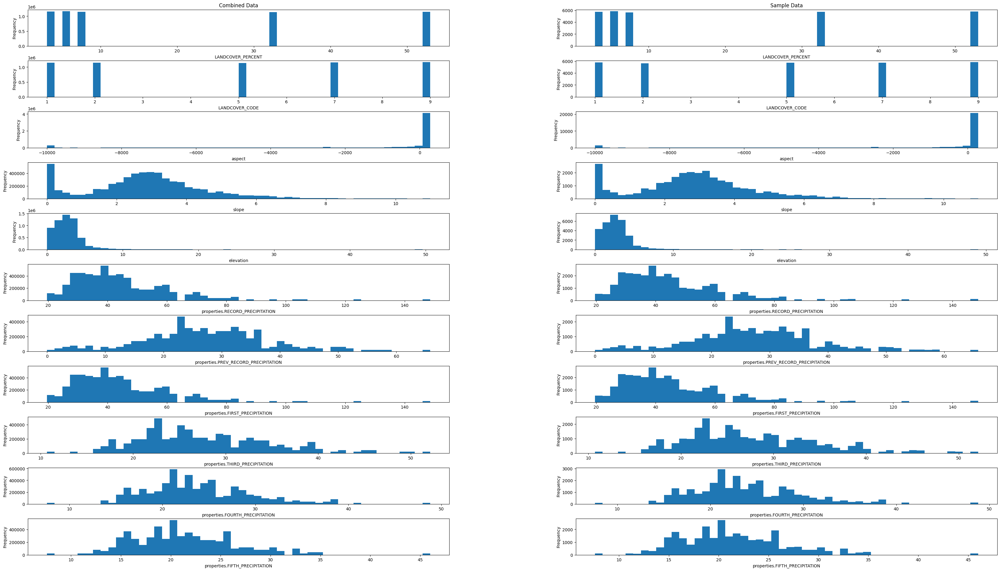

In [ ]:
# Define the columns to analyze
cols = ['LANDCOVER_PERCENT', 'LANDCOVER_CODE','aspect', 'slope', 'elevation','properties.RECORD_PRECIPITATION','properties.PREV_RECORD_PRECIPITATION'	,'properties.FIRST_PRECIPITATION', 'properties.THIRD_PRECIPITATION',	'properties.FOURTH_PRECIPITATION',	'properties.FIFTH_PRECIPITATION']

# Create a figure with subplots
fig, axs = plt.subplots(nrows=11, ncols=2, figsize=(40,25))

# Loop over each column
for i, col in enumerate(cols):

    # Plot histogram of combined data
    axs[i][0].hist(combined_data[col], bins=50)
    axs[i][0].set_xlabel(col)
    axs[i][0].set_ylabel('Frequency')
    #axs[i][0].set_title('Combined Data')

    # Plot histogram of sample data
    axs[i][1].hist(sample_data[col], bins=50)
    axs[i][1].set_xlabel(col)
    axs[i][1].set_ylabel('Frequency')

# Adjust the layout and spacing
axs[0][0].set_title('Combined Data')
axs[0][1].set_title('Sample Data')
plt.tight_layout()
plt.subplots_adjust(top=0.92, bottom=0.2, left=0.1, right=0.9, hspace=0.4, wspace=0.3)


#### NON FLOOD DATA

##### COMBINING NON FLOOD DATA WITH DEM DATA

Performing a spatial join to match the non-flood event data with the DEM DATA

In [ ]:
# Perform a spatial join based on intersecting geometries
non_flood_data = gpd.sjoin(non_flood_data, dem_data_clipped, how='left', op='intersects')
# Drop the 'index_right' column from the new DataFrame
non_flood_data= non_flood_data.drop('index_right', 1)
# Display the top 5 rows of the DataFrame
non_flood_data.head()

,flood,geometry,aspect,slope,elevation
0,0,MULTIPOLYGON Z (((2510000.000 7420000.000 0.00...,-2499.75,0.0,0.0
0,0,MULTIPOLYGON Z (((2510000.000 7420000.000 0.00...,-2499.75,0.0,0.0
0,0,MULTIPOLYGON Z (((2510000.000 7420000.000 0.00...,-2499.75,0.0,0.0
0,0,MULTIPOLYGON Z (((2510000.000 7420000.000 0.00...,-2499.75,0.0,0.0
0,0,MULTIPOLYGON Z (((2510000.000 7420000.000 0.00...,-2499.75,0.0,0.0


##### COMBINING the DEM_NON_FLOOD COMBINED data with LANDCOVER data

Performing a spatial join to match the non-flood event data with the Landcover data

In [ ]:
# Perform a spatial join based on intersecting geometries
non_flood_data = gpd.sjoin(non_flood_data, land_cover_data_clipped, how='left', op='intersects')
# Drop the 'index_right' column from the new DataFrame
non_flood_data= non_flood_data.drop('index_right', 1)
# Display the top 5 rows of the DataFrame
non_flood_data.head()

,flood,geometry,aspect,slope,elevation,LANDCOVER_PERCENT,LANDCOVER_CODE,DESCRIPTION_EN
0,0,MULTIPOLYGON Z (((2510000.000 7420000.000 0.00...,-2499.75,0.0,0.0,5,9,Cropland: cultivated land
0,0,MULTIPOLYGON Z (((2510000.000 7420000.000 0.00...,-2499.75,0.0,0.0,3,7,Sparsely Vegetated/Barren Land: plant cover ge...
0,0,MULTIPOLYGON Z (((2510000.000 7420000.000 0.00...,-2499.75,0.0,0.0,53,1,Mixed Forest: canopy 26-75% coniferous/broadle...
0,0,MULTIPOLYGON Z (((2510000.000 7420000.000 0.00...,-2499.75,0.0,0.0,32,5,Coniferous Forest: canopy >75% coniferous trees
0,0,MULTIPOLYGON Z (((2510000.000 7420000.000 0.00...,-2499.75,0.0,0.0,7,2,Broadleaf Forest: canopy >75% broadleaf trees


Sampling the combined data 

In [ ]:
# Randomly sample a fraction of rows from the DataFrame and display the top 5 rows
sample_non_flood_data = non_flood_data.sample(frac = 0.33)
sample_non_flood_data.head()

,flood,geometry,aspect,slope,elevation,LANDCOVER_PERCENT,LANDCOVER_CODE,DESCRIPTION_EN
0,0,MULTIPOLYGON Z (((2510000.000 7420000.000 0.00...,103.517540,5.154054,21.965164,3,7,Sparsely Vegetated/Barren Land: plant cover ge...
0,0,MULTIPOLYGON Z (((2510000.000 7420000.000 0.00...,158.531067,1.776497,26.757917,3,7,Sparsely Vegetated/Barren Land: plant cover ge...
0,0,MULTIPOLYGON Z (((2510000.000 7420000.000 0.00...,193.777786,3.803608,33.178909,32,5,Coniferous Forest: canopy >75% coniferous trees
0,0,MULTIPOLYGON Z (((2510000.000 7420000.000 0.00...,165.582611,4.271976,15.737912,32,5,Coniferous Forest: canopy >75% coniferous trees
0,0,MULTIPOLYGON Z (((2510000.000 7420000.000 0.00...,162.782211,3.969122,47.597187,3,7,Sparsely Vegetated/Barren Land: plant cover ge...


##### COMBINING PRECIPITATION DATA WITH REST OF THE COMBINED DATA

Performing a spatial join to match the non-flood event data with the Precipitation data

In [ ]:
# Perform a spatial join based on intersecting geometries
non_flood_data = gpd.sjoin(sample_non_flood_data, precipitation_data_clipped, how='left', op='intersects')
# Drop the 'index_right' column from the new DataFrame
non_flood_data= non_flood_data.drop('index_right', 1)

In [ ]:
# Display the top 5 rows
non_flood_data.head()

,flood,geometry,aspect,slope,elevation,LANDCOVER_PERCENT,LANDCOVER_CODE,DESCRIPTION_EN,properties.RECORD_PRECIPITATION,properties.PREV_RECORD_PRECIPITATION,properties.FIRST_PRECIPITATION,properties.SECOND_PRECIPITATION,properties.THIRD_PRECIPITATION,properties.FOURTH_PRECIPITATION,properties.FIFTH_PRECIPITATION
0,0,MULTIPOLYGON Z (((2510000.000 7420000.000 0.00...,103.51754,5.154054,21.965164,3,7,Sparsely Vegetated/Barren Land: plant cover ge...,96.8,9.9,96.8,42.9,36.6,29.5,24.4
0,0,MULTIPOLYGON Z (((2510000.000 7420000.000 0.00...,103.51754,5.154054,21.965164,3,7,Sparsely Vegetated/Barren Land: plant cover ge...,50.8,10.2,50.8,27.4,21.8,20.8,18.8
0,0,MULTIPOLYGON Z (((2510000.000 7420000.000 0.00...,103.51754,5.154054,21.965164,3,7,Sparsely Vegetated/Barren Land: plant cover ge...,35.8,27.2,35.8,27.2,24.8,24.4,22.8
0,0,MULTIPOLYGON Z (((2510000.000 7420000.000 0.00...,103.51754,5.154054,21.965164,3,7,Sparsely Vegetated/Barren Land: plant cover ge...,35.4,27.2,35.4,27.2,23.9,20.3,20.3
0,0,MULTIPOLYGON Z (((2510000.000 7420000.000 0.00...,103.51754,5.154054,21.965164,3,7,Sparsely Vegetated/Barren Land: plant cover ge...,36.3,18.5,36.3,20.8,20.5,19.3,18.5


Sampling the data

In [ ]:
# Randomly sample a fraction of rows from the DataFrame and display the top 5 rows
sample_non_flood_data = non_flood_data.sample(frac=0.0085)
sample_non_flood_data.head()

,flood,geometry,aspect,slope,elevation,LANDCOVER_PERCENT,LANDCOVER_CODE,DESCRIPTION_EN,properties.RECORD_PRECIPITATION,properties.PREV_RECORD_PRECIPITATION,properties.FIRST_PRECIPITATION,properties.SECOND_PRECIPITATION,properties.THIRD_PRECIPITATION,properties.FOURTH_PRECIPITATION,properties.FIFTH_PRECIPITATION
0,0,MULTIPOLYGON Z (((2510000.000 7420000.000 0.00...,169.484497,3.649328,15.827857,3,7,Sparsely Vegetated/Barren Land: plant cover ge...,31.2,19.8,31.2,30.6,28.2,22.9,19.8
0,0,MULTIPOLYGON Z (((2510000.000 7420000.000 0.00...,219.137207,5.258465,15.719191,3,7,Sparsely Vegetated/Barren Land: plant cover ge...,45.7,14.0,45.7,22.0,20.8,16.0,14.7
0,0,MULTIPOLYGON Z (((2510000.000 7420000.000 0.00...,40.047871,0.607335,10.400355,3,7,Sparsely Vegetated/Barren Land: plant cover ge...,27.9,22.9,27.9,26.6,25.4,22.9,22.9
0,0,MULTIPOLYGON Z (((2510000.000 7420000.000 0.00...,160.055573,2.952044,34.073513,5,9,Cropland: cultivated land,44.7,23.1,44.7,30.5,23.1,20.6,19.8
0,0,MULTIPOLYGON Z (((2510000.000 7420000.000 0.00...,196.403458,2.989979,48.830582,53,1,Mixed Forest: canopy 26-75% coniferous/broadle...,51.6,23.1,51.6,26.8,23.1,16.5,16.2


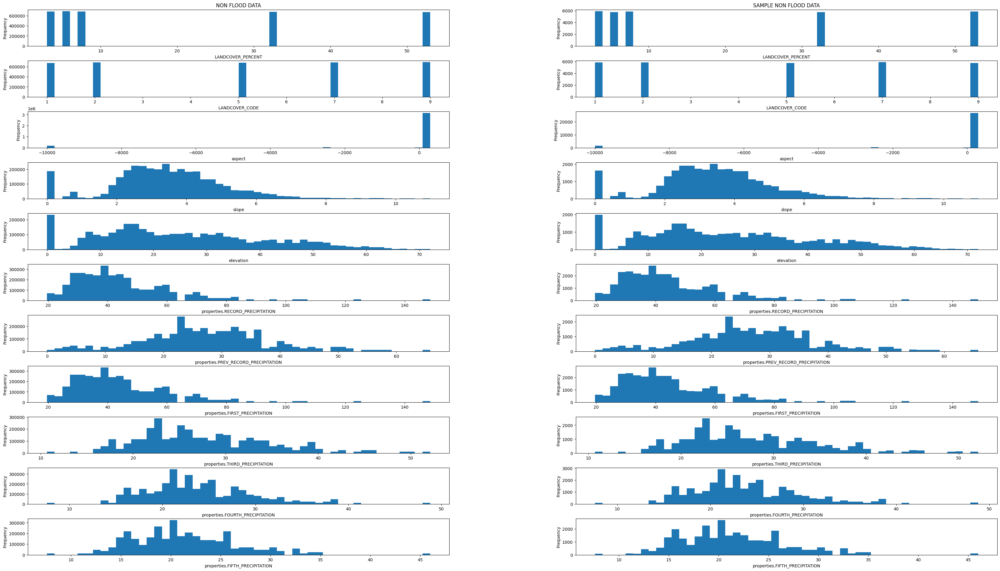

In [ ]:
# Define the columns to analyze
cols = ['LANDCOVER_PERCENT', 'LANDCOVER_CODE','aspect', 'slope', 'elevation','properties.RECORD_PRECIPITATION', \
        'properties.PREV_RECORD_PRECIPITATION'	,'properties.FIRST_PRECIPITATION', 'properties.THIRD_PRECIPITATION',	\
        'properties.FOURTH_PRECIPITATION','properties.FIFTH_PRECIPITATION']

# Create a figure with subplots
fig, axs = plt.subplots(nrows=11, ncols=2, figsize=(40,25))

# Loop over each column
for i, col in enumerate(cols):

    # Plot histogram of combined data
    axs[i][0].hist(non_flood_data[col], bins=50)
    axs[i][0].set_xlabel(col)
    axs[i][0].set_ylabel('Frequency')

    # Plot histogram of sample data
    axs[i][1].hist(sample_non_flood_data[col], bins=50)
    axs[i][1].set_xlabel(col)
    axs[i][1].set_ylabel('Frequency')

# Adjust the layout and spacing
axs[0][0].set_title('NON FLOOD DATA')
axs[0][1].set_title('SAMPLE NON FLOOD DATA')
plt.tight_layout()
plt.subplots_adjust(top=0.92, bottom=0.2, left=0.1, right=0.9, hspace=0.4, wspace=0.3)

##### COMBINING THE FLOOD AND NON FLOOD DATAFRAMES

The code combines the subsampled flood and non-flood data into a final dataset, which will be used for modeling and analysis. The pd.concat() function is used to concatenate the two datasets vertically (i.e., stacking one on top of the other), and the ignore_index=True parameter is used to reset the index of the resulting DataFrame. The resulting DATA_PREPROCESSING DataFrame contains both the flood and non-flood samples, and will be used for further analysis and modeling.

In [ ]:
# Combining the dataframes
FINAL_DATA = pd.concat([sample_data, sample_non_flood_data], ignore_index=True)
# Display the top 5 rows
FINAL_DATA.head()

,flood,geometry,aspect,slope,elevation,LANDCOVER_PERCENT,LANDCOVER_CODE,DESCRIPTION_EN,properties.RECORD_PRECIPITATION,properties.PREV_RECORD_PRECIPITATION,properties.FIRST_PRECIPITATION,properties.SECOND_PRECIPITATION,properties.THIRD_PRECIPITATION,properties.FOURTH_PRECIPITATION,properties.FIFTH_PRECIPITATION
0,1,MULTIPOLYGON Z (((2525002.920 7354660.866 0.00...,-9999.000000,0.000000,0.000000,32,5,Coniferous Forest: canopy >75% coniferous trees,41.7,21.1,41.7,21.1,20.8,17.8,17.3
1,1,MULTIPOLYGON Z (((2470800.715 7395726.498 0.00...,-539.021912,2.194580,1.281396,32,5,Coniferous Forest: canopy >75% coniferous trees,36.3,22.9,36.3,23.1,22.9,21.1,20.8
2,1,MULTIPOLYGON Z (((2529396.476 7358269.813 0.00...,191.145981,2.767675,2.022524,5,9,Cropland: cultivated land,59.4,55.6,59.4,55.6,39.0,30.5,29.5
3,1,MULTIPOLYGON Z (((2504924.513 7419108.325 0.00...,181.321289,2.489768,3.805946,53,1,Mixed Forest: canopy 26-75% coniferous/broadle...,43.9,24.1,43.9,41.9,25.8,25.7,24.1
4,1,MULTIPOLYGON Z (((2531225.466 7359561.173 0.00...,179.144531,2.726257,2.625988,3,7,Sparsely Vegetated/Barren Land: plant cover ge...,31.8,30.2,31.8,30.2,23.1,21.2,18.7


In [ ]:
# Print the information about theDataFrame
FINAL_DATA.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 57667 entries, 0 to 57666
Data columns (total 15 columns):
 #   Column                                Non-Null Count  Dtype   
---  ------                                --------------  -----   
 0   flood                                 57667 non-null  int64   
 1   geometry                              57667 non-null  geometry
 2   aspect                                57667 non-null  float64 
 3   slope                                 57667 non-null  float64 
 4   elevation                             57667 non-null  float64 
 5   LANDCOVER_PERCENT                     57667 non-null  int64   
 6   LANDCOVER_CODE                        57667 non-null  int64   
 7   DESCRIPTION_EN                        57667 non-null  object  
 8   properties.RECORD_PRECIPITATION       57667 non-null  float64 
 9   properties.PREV_RECORD_PRECIPITATION  56863 non-null  float64 
 10  properties.FIRST_PRECIPITATION        57667 non-null  float64 

In [ ]:
# Print the CRS of the DataFrame
FINAL_DATA.crs

<Projected CRS: EPSG:2953>
Name: NAD83(CSRS) / New Brunswick Stereographic
Axis Info [cartesian]:
- N[north]: Northing (metre)
- E[east]: Easting (metre)
Area of Use:
- name: Canada - New Brunswick.
- bounds: (-69.05, 44.56, -63.7, 48.07)
Coordinate Operation:
- name: New Brunswick Stereographic (NAD83)
- method: Oblique Stereographic
Datum: NAD83 Canadian Spatial Reference System
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

### 6. DATA PREPROCESSING

The following step is for naming convention so that it is easier to follow the code. It is an additional step but helps increase the readability of the code.

In [ ]:
# Assigning final_data variable to increase the readability
DATA_PREPROCESSING = FINAL_DATA

#### PREPROCESSING PRECIPITATION DATA

These lines of code calculate various statistics related to precipitation data such as mean, standard deviation, percentiles and maximum precipitation. These statistics are important for flood prediction as they provide insight into the distribution and variability of precipitation in the study area.

In [ ]:
# Load precipitation data
precipitation_data = DATA_PREPROCESSING[['properties.FIRST_PRECIPITATION'	,'properties.THIRD_PRECIPITATION'	,'properties.FOURTH_PRECIPITATION'	,'properties.FIFTH_PRECIPITATION']]

# Calculate mean precipitation
mean_precipitation = np.mean(precipitation_data,axis=1)
DATA_PREPROCESSING['MEAN_PRECIPITATION'] = mean_precipitation

# Calculate standard deviation of precipitation
std_precipitation = np.std(precipitation_data,axis=1)
DATA_PREPROCESSING['STD_PRECIPITATION'] = std_precipitation

# Calculate percentiles of precipitation (25th, 50th, and 75th)
percentiles_precipitation = np.percentile(precipitation_data, [25, 50, 75],axis=1)
percentiles_df = pd.DataFrame(percentiles_precipitation.T, columns=['25th PERCENTILE PRECIPITATION', '50th PERCENTILE PRECIPITATION', '75th PERCENTILE PRECIPITATION'])
DATA_PREPROCESSING = DATA_PREPROCESSING.join(percentiles_df)

In [ ]:
# Load precipitation data
max_precipitation_data = DATA_PREPROCESSING['properties.RECORD_PRECIPITATION']	
previous_max_precipitation_data = DATA_PREPROCESSING['properties.PREV_RECORD_PRECIPITATION']

# Calculate MAX precipitation
difference_precipitation_data = max_precipitation_data - previous_max_precipitation_data
DATA_PREPROCESSING['MAX_PRECIPITATION'] = max_precipitation_data
DATA_PREPROCESSING['DIFFERENCE_MAX_PRECIPITATION'] = difference_precipitation_data

In [ ]:
# Display top 5 rows
DATA_PREPROCESSING.head()

,flood,geometry,aspect,slope,elevation,LANDCOVER_PERCENT,LANDCOVER_CODE,DESCRIPTION_EN,properties.RECORD_PRECIPITATION,properties.PREV_RECORD_PRECIPITATION,...,properties.THIRD_PRECIPITATION,properties.FOURTH_PRECIPITATION,properties.FIFTH_PRECIPITATION,MEAN_PRECIPITATION,STD_PRECIPITATION,25th PERCENTILE PRECIPITATION,50th PERCENTILE PRECIPITATION,75th PERCENTILE PRECIPITATION,MAX_PRECIPITATION,DIFFERENCE_MAX_PRECIPITATION
0,1,MULTIPOLYGON Z (((2525002.920 7354660.866 0.00...,-9999.000000,0.000000,0.000000,32,5,Coniferous Forest: canopy >75% coniferous trees,41.7,21.1,...,20.8,17.8,17.3,24.400,10.077450,17.675,19.30,26.025,41.7,20.6
1,1,MULTIPOLYGON Z (((2470800.715 7395726.498 0.00...,-539.021912,2.194580,1.281396,32,5,Coniferous Forest: canopy >75% coniferous trees,36.3,22.9,...,22.9,21.1,20.8,25.275,6.415752,21.025,22.00,26.250,36.3,13.4
2,1,MULTIPOLYGON Z (((2529396.476 7358269.813 0.00...,191.145981,2.767675,2.022524,5,9,Cropland: cultivated land,59.4,55.6,...,39.0,30.5,29.5,39.600,12.012702,30.250,34.75,44.100,59.4,3.8
3,1,MULTIPOLYGON Z (((2504924.513 7419108.325 0.00...,181.321289,2.489768,3.805946,53,1,Mixed Forest: canopy 26-75% coniferous/broadle...,43.9,24.1,...,25.8,25.7,24.1,29.875,8.125385,25.300,25.75,30.325,43.9,19.8
4,1,MULTIPOLYGON Z (((2531225.466 7359561.173 0.00...,179.144531,2.726257,2.625988,3,7,Sparsely Vegetated/Barren Land: plant cover ge...,31.8,30.2,...,23.1,21.2,18.7,23.700,4.930010,20.575,22.15,25.275,31.8,1.6


#### Standardizing the PRECIPITATION DATA

In this code, I am standardizing the precipitation data using MinMaxScaler from the sklearn library. The data is first loaded into separate arrays for each type of precipitation data, and then each array is standardized using the scaler object. The standardized data is then combined into a new dataframe, where each type of standardized precipitation data is stored in a separate column.

I am doing this to ensure that all of the precipitation data is on the same scale, which is important for some machine learning algorithms that are sensitive to differences in scale between features. Standardization also helps to improve the accuracy and stability of the machine learning model.

In [ ]:
# Load precipitation data
max_precipitation_data = np.array(DATA_PREPROCESSING['MAX_PRECIPITATION'])
difference_max_precipitation_data = np.array(DATA_PREPROCESSING['DIFFERENCE_MAX_PRECIPITATION'])
std_precipitation_data = np.array(DATA_PREPROCESSING['STD_PRECIPITATION'])
mean_precipitation_data = np.array(DATA_PREPROCESSING['MEAN_PRECIPITATION'])
precipitation_25th_data = np.array(DATA_PREPROCESSING['25th PERCENTILE PRECIPITATION'])
precipitation_50th_data = np.array(DATA_PREPROCESSING['50th PERCENTILE PRECIPITATION'])
precipitation_75th_data = np.array(DATA_PREPROCESSING['75th PERCENTILE PRECIPITATION'])

# Standardize data
scaler = MinMaxScaler()
max_precipitation_data_standardized = scaler.fit_transform(max_precipitation_data.reshape(-1, 1))
difference_max_precipitation_data_standardized = scaler.fit_transform(difference_max_precipitation_data.reshape(-1, 1))
std_precipitation_data_standardized = scaler.fit_transform(std_precipitation_data.reshape(-1, 1))
mean_precipitation_data_standardized = scaler.fit_transform(mean_precipitation_data.reshape(-1, 1))
precipitation_25th_data_standardized = scaler.fit_transform(precipitation_25th_data.reshape(-1, 1))
precipitation_50th_data_standardized = scaler.fit_transform(precipitation_50th_data.reshape(-1, 1))
precipitation_75th_data_standardized = scaler.fit_transform(precipitation_75th_data.reshape(-1, 1))


# Combine standardized data into a new dataframe
DATA_PREPROCESSING['MAX_PRECIPITATION_PREPROCESSED'] = max_precipitation_data_standardized
DATA_PREPROCESSING['DIFFERENCE_MAX_PRECIPITATION_PREPROCESSED'] = difference_max_precipitation_data_standardized
DATA_PREPROCESSING['STD_PRECIPITATION_PREPROCESSED'] = std_precipitation_data_standardized 
DATA_PREPROCESSING['MEAN_PRECIPITATION_PREPROCESSED'] = mean_precipitation_data_standardized 
DATA_PREPROCESSING['25th_PERCENTILE_PRECIPITATION_PREPROCESSED'] = precipitation_25th_data_standardized
DATA_PREPROCESSING['50th_PERCENTILE_PRECIPITATION_PREPROCESSED'] = precipitation_50th_data_standardized
DATA_PREPROCESSING['75th_PERCENTILE_PRECIPITATION_PREPROCESSED'] = precipitation_75th_data_standardized


In [ ]:
# Display top 5 rows
DATA_PREPROCESSING.head()

,flood,geometry,aspect,slope,elevation,LANDCOVER_PERCENT,LANDCOVER_CODE,DESCRIPTION_EN,properties.RECORD_PRECIPITATION,properties.PREV_RECORD_PRECIPITATION,...,75th PERCENTILE PRECIPITATION,MAX_PRECIPITATION,DIFFERENCE_MAX_PRECIPITATION,MAX_PRECIPITATION_PREPROCESSED,DIFFERENCE_MAX_PRECIPITATION_PREPROCESSED,STD_PRECIPITATION_PREPROCESSED,MEAN_PRECIPITATION_PREPROCESSED,25th_PERCENTILE_PRECIPITATION_PREPROCESSED,50th_PERCENTILE_PRECIPITATION_PREPROCESSED,75th_PERCENTILE_PRECIPITATION_PREPROCESSED
0,1,MULTIPOLYGON Z (((2525002.920 7354660.866 0.00...,-9999.000000,0.000000,0.000000,32,5,Coniferous Forest: canopy >75% coniferous trees,41.7,21.1,...,26.025,41.7,20.6,0.171318,0.207661,0.182179,0.196947,0.248765,0.255990,0.195685
1,1,MULTIPOLYGON Z (((2470800.715 7395726.498 0.00...,-539.021912,2.194580,1.281396,32,5,Coniferous Forest: canopy >75% coniferous trees,36.3,22.9,...,26.250,36.3,13.4,0.129457,0.135081,0.105201,0.214758,0.331481,0.324086,0.200201
2,1,MULTIPOLYGON Z (((2529396.476 7358269.813 0.00...,191.145981,2.767675,2.022524,5,9,Cropland: cultivated land,59.4,55.6,...,44.100,59.4,3.8,0.308527,0.038306,0.222862,0.506361,0.559259,0.645649,0.558455
3,1,MULTIPOLYGON Z (((2504924.513 7419108.325 0.00...,181.321289,2.489768,3.805946,53,1,Mixed Forest: canopy 26-75% coniferous/broadle...,43.9,24.1,...,30.325,43.9,19.8,0.188372,0.199597,0.141141,0.308397,0.437037,0.418663,0.281987
4,1,MULTIPOLYGON Z (((2531225.466 7359561.173 0.00...,179.144531,2.726257,2.625988,3,7,Sparsely Vegetated/Barren Land: plant cover ge...,31.8,30.2,...,25.275,31.8,1.6,0.094574,0.016129,0.073967,0.182697,0.320370,0.327869,0.180632


#### DROP unnecessary columns of precipitation

DROPPING PRECIPITATION Columns which are no longer used. By dropping these columns, I can streamline the dataset and focus on the relevant features and variables that are essential for the desired analysis or modeling process.

In [ ]:
# Drop columns on a particular axis
DATA_PREPROCESSING = DATA_PREPROCESSING.drop(['properties.FIRST_PRECIPITATION'	,'properties.THIRD_PRECIPITATION'	,\
    'properties.FOURTH_PRECIPITATION'	,'properties.FIFTH_PRECIPITATION','properties.RECORD_PRECIPITATION',\
    'properties.PREV_RECORD_PRECIPITATION'],axis=1)

In [ ]:
# Drop columns on a particular axis
DATA_PREPROCESSING = DATA_PREPROCESSING.drop(['MAX_PRECIPITATION','DIFFERENCE_MAX_PRECIPITATION','STD_PRECIPITATION',\
      'MEAN_PRECIPITATION','25th PERCENTILE PRECIPITATION','50th PERCENTILE PRECIPITATION',\
      '75th PERCENTILE PRECIPITATION'],axis=1)

In [ ]:
# Display the top 5 rows
DATA_PREPROCESSING.head()

,flood,geometry,aspect,slope,elevation,LANDCOVER_PERCENT,LANDCOVER_CODE,DESCRIPTION_EN,properties.SECOND_PRECIPITATION,MAX_PRECIPITATION_PREPROCESSED,DIFFERENCE_MAX_PRECIPITATION_PREPROCESSED,STD_PRECIPITATION_PREPROCESSED,MEAN_PRECIPITATION_PREPROCESSED,25th_PERCENTILE_PRECIPITATION_PREPROCESSED,50th_PERCENTILE_PRECIPITATION_PREPROCESSED,75th_PERCENTILE_PRECIPITATION_PREPROCESSED
0,1,MULTIPOLYGON Z (((2525002.920 7354660.866 0.00...,-9999.000000,0.000000,0.000000,32,5,Coniferous Forest: canopy >75% coniferous trees,21.1,0.171318,0.207661,0.182179,0.196947,0.248765,0.255990,0.195685
1,1,MULTIPOLYGON Z (((2470800.715 7395726.498 0.00...,-539.021912,2.194580,1.281396,32,5,Coniferous Forest: canopy >75% coniferous trees,23.1,0.129457,0.135081,0.105201,0.214758,0.331481,0.324086,0.200201
2,1,MULTIPOLYGON Z (((2529396.476 7358269.813 0.00...,191.145981,2.767675,2.022524,5,9,Cropland: cultivated land,55.6,0.308527,0.038306,0.222862,0.506361,0.559259,0.645649,0.558455
3,1,MULTIPOLYGON Z (((2504924.513 7419108.325 0.00...,181.321289,2.489768,3.805946,53,1,Mixed Forest: canopy 26-75% coniferous/broadle...,41.9,0.188372,0.199597,0.141141,0.308397,0.437037,0.418663,0.281987
4,1,MULTIPOLYGON Z (((2531225.466 7359561.173 0.00...,179.144531,2.726257,2.625988,3,7,Sparsely Vegetated/Barren Land: plant cover ge...,30.2,0.094574,0.016129,0.073967,0.182697,0.320370,0.327869,0.180632


#### PREPROCESSING LANDCOVER

The LANDCOVER_PERCENT and LANDCOVER_CODE columns contain numerical data representing the percentage and category code of land cover types. The description column is not needed for data analysis, so it is dropped while the other two columns are kept as they are in a useful format for analysis.

In [ ]:
# Drop columns on a particular axis
DATA_PREPROCESSING = DATA_PREPROCESSING.drop('DESCRIPTION_EN',axis=1)

In [ ]:
# Display top 5 rows
DATA_PREPROCESSING.head()

,flood,geometry,aspect,slope,elevation,LANDCOVER_PERCENT,LANDCOVER_CODE,properties.SECOND_PRECIPITATION,MAX_PRECIPITATION_PREPROCESSED,DIFFERENCE_MAX_PRECIPITATION_PREPROCESSED,STD_PRECIPITATION_PREPROCESSED,MEAN_PRECIPITATION_PREPROCESSED,25th_PERCENTILE_PRECIPITATION_PREPROCESSED,50th_PERCENTILE_PRECIPITATION_PREPROCESSED,75th_PERCENTILE_PRECIPITATION_PREPROCESSED
0,1,MULTIPOLYGON Z (((2525002.920 7354660.866 0.00...,-9999.000000,0.000000,0.000000,32,5,21.1,0.171318,0.207661,0.182179,0.196947,0.248765,0.255990,0.195685
1,1,MULTIPOLYGON Z (((2470800.715 7395726.498 0.00...,-539.021912,2.194580,1.281396,32,5,23.1,0.129457,0.135081,0.105201,0.214758,0.331481,0.324086,0.200201
2,1,MULTIPOLYGON Z (((2529396.476 7358269.813 0.00...,191.145981,2.767675,2.022524,5,9,55.6,0.308527,0.038306,0.222862,0.506361,0.559259,0.645649,0.558455
3,1,MULTIPOLYGON Z (((2504924.513 7419108.325 0.00...,181.321289,2.489768,3.805946,53,1,41.9,0.188372,0.199597,0.141141,0.308397,0.437037,0.418663,0.281987
4,1,MULTIPOLYGON Z (((2531225.466 7359561.173 0.00...,179.144531,2.726257,2.625988,3,7,30.2,0.094574,0.016129,0.073967,0.182697,0.320370,0.327869,0.180632


#### PREPROCESSING DEM DATA


In this code, elevation, slope, and aspect data are standardized using MinMaxScaler. Standardization helps to scale the features to a common range, making them easier to compare and work with in machine learning models. The standardized data is then combined into a new dataframe with new column names, representing the preprocessed features.

In [ ]:
# Load elevation, slope, and aspect data
elevation_data = np.array(DATA_PREPROCESSING['elevation'])
slope_data = np.array(DATA_PREPROCESSING['slope'])
aspect_data = np.array(DATA_PREPROCESSING['aspect'])

# Standardize data
scaler = MinMaxScaler()
elevation_data_standardized = scaler.fit_transform(elevation_data.reshape(-1, 1))
slope_data_standardized = scaler.fit_transform(slope_data.reshape(-1, 1))
aspect_data_standardized = scaler.fit_transform(aspect_data.reshape(-1, 1))

# Combine standardized data into a new dataframe
DATA_PREPROCESSING['ELEVATION_PREPROCESSED'] = elevation_data_standardized
DATA_PREPROCESSING['SLOPE_PREPROCESSED'] = slope_data_standardized
DATA_PREPROCESSING['ASPECT_PREPROCESSED'] = aspect_data_standardized

In [ ]:
# Display top 5 rows
DATA_PREPROCESSING.head()

,flood,geometry,aspect,slope,elevation,LANDCOVER_PERCENT,LANDCOVER_CODE,properties.SECOND_PRECIPITATION,MAX_PRECIPITATION_PREPROCESSED,DIFFERENCE_MAX_PRECIPITATION_PREPROCESSED,STD_PRECIPITATION_PREPROCESSED,MEAN_PRECIPITATION_PREPROCESSED,25th_PERCENTILE_PRECIPITATION_PREPROCESSED,50th_PERCENTILE_PRECIPITATION_PREPROCESSED,75th_PERCENTILE_PRECIPITATION_PREPROCESSED,ELEVATION_PREPROCESSED,SLOPE_PREPROCESSED,ASPECT_PREPROCESSED
0,1,MULTIPOLYGON Z (((2525002.920 7354660.866 0.00...,-9999.000000,0.000000,0.000000,32,5,21.1,0.171318,0.207661,0.182179,0.196947,0.248765,0.255990,0.195685,0.000000,0.000000,0.000000
1,1,MULTIPOLYGON Z (((2470800.715 7395726.498 0.00...,-539.021912,2.194580,1.281396,32,5,23.1,0.129457,0.135081,0.105201,0.214758,0.331481,0.324086,0.200201,0.017795,0.199650,0.918887
2,1,MULTIPOLYGON Z (((2529396.476 7358269.813 0.00...,191.145981,2.767675,2.022524,5,9,55.6,0.308527,0.038306,0.222862,0.506361,0.559259,0.645649,0.558455,0.028088,0.251787,0.989811
3,1,MULTIPOLYGON Z (((2504924.513 7419108.325 0.00...,181.321289,2.489768,3.805946,53,1,41.9,0.188372,0.199597,0.141141,0.308397,0.437037,0.418663,0.281987,0.052855,0.226505,0.988856
4,1,MULTIPOLYGON Z (((2531225.466 7359561.173 0.00...,179.144531,2.726257,2.625988,3,7,30.2,0.094574,0.016129,0.073967,0.182697,0.320370,0.327869,0.180632,0.036468,0.248019,0.988645


#### DROPPING DEM RELATED COLUMNS

I am dropping the columns slope, elevation, and aspect from the DATA_PREPROCESSING DataFrame because they have been standardized and new columns with the standardized values have been created. By removing the original columns, redundancy is reduced and keeping only the standardized versions of these variables, which are more suitable for the analysis or modeling task at hand. This helps to streamline the dataset and focus on the standardized features for further analysis.

In [ ]:
# Drop columns on a particular axis and display top 5 rows
DATA_PREPROCESSING = DATA_PREPROCESSING.drop(['slope','elevation','aspect'],axis=1)
DATA_PREPROCESSING.head()

,flood,geometry,LANDCOVER_PERCENT,LANDCOVER_CODE,properties.SECOND_PRECIPITATION,MAX_PRECIPITATION_PREPROCESSED,DIFFERENCE_MAX_PRECIPITATION_PREPROCESSED,STD_PRECIPITATION_PREPROCESSED,MEAN_PRECIPITATION_PREPROCESSED,25th_PERCENTILE_PRECIPITATION_PREPROCESSED,50th_PERCENTILE_PRECIPITATION_PREPROCESSED,75th_PERCENTILE_PRECIPITATION_PREPROCESSED,ELEVATION_PREPROCESSED,SLOPE_PREPROCESSED,ASPECT_PREPROCESSED
0,1,MULTIPOLYGON Z (((2525002.920 7354660.866 0.00...,32,5,21.1,0.171318,0.207661,0.182179,0.196947,0.248765,0.255990,0.195685,0.000000,0.000000,0.000000
1,1,MULTIPOLYGON Z (((2470800.715 7395726.498 0.00...,32,5,23.1,0.129457,0.135081,0.105201,0.214758,0.331481,0.324086,0.200201,0.017795,0.199650,0.918887
2,1,MULTIPOLYGON Z (((2529396.476 7358269.813 0.00...,5,9,55.6,0.308527,0.038306,0.222862,0.506361,0.559259,0.645649,0.558455,0.028088,0.251787,0.989811
3,1,MULTIPOLYGON Z (((2504924.513 7419108.325 0.00...,53,1,41.9,0.188372,0.199597,0.141141,0.308397,0.437037,0.418663,0.281987,0.052855,0.226505,0.988856
4,1,MULTIPOLYGON Z (((2531225.466 7359561.173 0.00...,3,7,30.2,0.094574,0.016129,0.073967,0.182697,0.320370,0.327869,0.180632,0.036468,0.248019,0.988645


#### PREPROCESSING GEOMETRY COLUMN

These lines calculate the area and perimeter of each geometry (polygon) in the dataset and add them as new columns to the dataframe. This information can be useful for machine learning models to better understand the spatial characteristics of the areas and make more accurate flood predictions.

In [ ]:
# Calculate area and perimeter
DATA_PREPROCESSING['AREA'] = DATA_PREPROCESSING.geometry.area
DATA_PREPROCESSING['PERIMETER']  = DATA_PREPROCESSING.geometry.length

In [ ]:
# Display top 5 rows
DATA_PREPROCESSING.head()

,flood,geometry,LANDCOVER_PERCENT,LANDCOVER_CODE,properties.SECOND_PRECIPITATION,MAX_PRECIPITATION_PREPROCESSED,DIFFERENCE_MAX_PRECIPITATION_PREPROCESSED,STD_PRECIPITATION_PREPROCESSED,MEAN_PRECIPITATION_PREPROCESSED,25th_PERCENTILE_PRECIPITATION_PREPROCESSED,50th_PERCENTILE_PRECIPITATION_PREPROCESSED,75th_PERCENTILE_PRECIPITATION_PREPROCESSED,ELEVATION_PREPROCESSED,SLOPE_PREPROCESSED,ASPECT_PREPROCESSED,AREA,PERIMETER
0,1,MULTIPOLYGON Z (((2525002.920 7354660.866 0.00...,32,5,21.1,0.171318,0.207661,0.182179,0.196947,0.248765,0.255990,0.195685,0.000000,0.000000,0.000000,1.213128e+09,3.795621e+06
1,1,MULTIPOLYGON Z (((2470800.715 7395726.498 0.00...,32,5,23.1,0.129457,0.135081,0.105201,0.214758,0.331481,0.324086,0.200201,0.017795,0.199650,0.918887,4.584094e+08,1.341502e+06
2,1,MULTIPOLYGON Z (((2529396.476 7358269.813 0.00...,5,9,55.6,0.308527,0.038306,0.222862,0.506361,0.559259,0.645649,0.558455,0.028088,0.251787,0.989811,1.753888e+08,3.619221e+06
3,1,MULTIPOLYGON Z (((2504924.513 7419108.325 0.00...,53,1,41.9,0.188372,0.199597,0.141141,0.308397,0.437037,0.418663,0.281987,0.052855,0.226505,0.988856,2.228096e+08,7.351771e+05
4,1,MULTIPOLYGON Z (((2531225.466 7359561.173 0.00...,3,7,30.2,0.094574,0.016129,0.073967,0.182697,0.320370,0.327869,0.180632,0.036468,0.248019,0.988645,1.269577e+08,2.333692e+06


Scaling AREA AND PERIMETER

In [ ]:
# Scale and transform
scaler = MinMaxScaler()
DATA_PREPROCESSING[['AREA_SCALED', 'PERIMETER_SCALED']] = scaler.fit_transform(DATA_PREPROCESSING[['AREA', 'PERIMETER']])

In [ ]:
# Drop columns on a particular axis
DATA_PREPROCESSING = DATA_PREPROCESSING.drop(['AREA',	'PERIMETER'],axis=1)

STORING GEOMETRY DATA AS SEPARATE TO USE LATER FOR PLOTTING

In [ ]:
GEOMETRY_DATA = gpd.GeoDataFrame(geometry=DATA_PREPROCESSING['geometry'])
# Display top 5 rows
GEOMETRY_DATA.head()

,geometry
0,MULTIPOLYGON Z (((2525002.920 7354660.866 0.00...
1,MULTIPOLYGON Z (((2470800.715 7395726.498 0.00...
2,MULTIPOLYGON Z (((2529396.476 7358269.813 0.00...
3,MULTIPOLYGON Z (((2504924.513 7419108.325 0.00...
4,MULTIPOLYGON Z (((2531225.466 7359561.173 0.00...


DROPPING THE GEOMETRY DATA

In [ ]:
# Drop geometry column
PREPROCESSED_DATA = DATA_PREPROCESSING.drop(['geometry'],axis=1)

PREPROCESSED DATA

In [ ]:
# Display top 5 rows
PREPROCESSED_DATA.head()

,flood,LANDCOVER_PERCENT,LANDCOVER_CODE,properties.SECOND_PRECIPITATION,MAX_PRECIPITATION_PREPROCESSED,DIFFERENCE_MAX_PRECIPITATION_PREPROCESSED,STD_PRECIPITATION_PREPROCESSED,MEAN_PRECIPITATION_PREPROCESSED,25th_PERCENTILE_PRECIPITATION_PREPROCESSED,50th_PERCENTILE_PRECIPITATION_PREPROCESSED,75th_PERCENTILE_PRECIPITATION_PREPROCESSED,ELEVATION_PREPROCESSED,SLOPE_PREPROCESSED,ASPECT_PREPROCESSED,AREA_SCALED,PERIMETER_SCALED
0,1,32,5,21.1,0.171318,0.207661,0.182179,0.196947,0.248765,0.255990,0.195685,0.000000,0.000000,0.000000,1.000000,0.666132
1,1,32,5,23.1,0.129457,0.135081,0.105201,0.214758,0.331481,0.324086,0.200201,0.017795,0.199650,0.918887,0.363692,0.185204
2,1,5,9,55.6,0.308527,0.038306,0.222862,0.506361,0.559259,0.645649,0.558455,0.028088,0.251787,0.989811,0.125076,0.631564
3,1,53,1,41.9,0.188372,0.199597,0.141141,0.308397,0.437037,0.418663,0.281987,0.052855,0.226505,0.988856,0.165056,0.066384
4,1,3,7,30.2,0.094574,0.016129,0.073967,0.182697,0.320370,0.327869,0.180632,0.036468,0.248019,0.988645,0.084243,0.379641


In [ ]:
# Print the information about the DataFrame
PREPROCESSED_DATA.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 57667 entries, 0 to 57666
Data columns (total 16 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   flood                                       57667 non-null  int64  
 1   LANDCOVER_PERCENT                           57667 non-null  int64  
 2   LANDCOVER_CODE                              57667 non-null  int64  
 3   properties.SECOND_PRECIPITATION             57667 non-null  float64
 4   MAX_PRECIPITATION_PREPROCESSED              57667 non-null  float64
 5   DIFFERENCE_MAX_PRECIPITATION_PREPROCESSED   56863 non-null  float64
 6   STD_PRECIPITATION_PREPROCESSED              57667 non-null  float64
 7   MEAN_PRECIPITATION_PREPROCESSED             57667 non-null  float64
 8   25th_PERCENTILE_PRECIPITATION_PREPROCESSED  57667 non-null  float64
 9   50th_PERCENTILE_PRECIPITATION_PREPROCESSED  57667 non-null  float64
 10  75th_PERCE

In [ ]:
# Cleaning the dataframe 
PREPROCESSED_DATA = PREPROCESSED_DATA.dropna()
PREPROCESSED_DATA = PREPROCESSED_DATA.drop_duplicates()
PREPROCESSED_DATA

,flood,LANDCOVER_PERCENT,LANDCOVER_CODE,properties.SECOND_PRECIPITATION,MAX_PRECIPITATION_PREPROCESSED,DIFFERENCE_MAX_PRECIPITATION_PREPROCESSED,STD_PRECIPITATION_PREPROCESSED,MEAN_PRECIPITATION_PREPROCESSED,25th_PERCENTILE_PRECIPITATION_PREPROCESSED,50th_PERCENTILE_PRECIPITATION_PREPROCESSED,75th_PERCENTILE_PRECIPITATION_PREPROCESSED,ELEVATION_PREPROCESSED,SLOPE_PREPROCESSED,ASPECT_PREPROCESSED,AREA_SCALED,PERIMETER_SCALED
0,1,32,5,21.1,0.171318,0.207661,0.182179,0.196947,0.248765,0.255990,0.195685,0.000000,0.000000,0.000000,1.000000,0.666132
1,1,32,5,23.1,0.129457,0.135081,0.105201,0.214758,0.331481,0.324086,0.200201,0.017795,0.199650,0.918887,0.363692,0.185204
2,1,5,9,55.6,0.308527,0.038306,0.222862,0.506361,0.559259,0.645649,0.558455,0.028088,0.251787,0.989811,0.125076,0.631564
3,1,53,1,41.9,0.188372,0.199597,0.141141,0.308397,0.437037,0.418663,0.281987,0.052855,0.226505,0.988856,0.165056,0.066384
4,1,3,7,30.2,0.094574,0.016129,0.073967,0.182697,0.320370,0.327869,0.180632,0.036468,0.248019,0.988645,0.084243,0.379641
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57662,0,32,5,18.5,0.024806,0.043347,0.026666,0.075827,0.216667,0.210593,0.066232,0.400797,0.207449,0.988913,0.192726,0.000000
57663,0,3,7,57.2,0.396124,0.136089,0.365777,0.591858,0.475309,0.773014,0.812343,0.777079,0.207471,0.989913,0.192726,0.000000
57664,0,3,7,39.2,0.330233,0.603831,0.339525,0.360814,0.308642,0.387137,0.412945,0.390676,0.162333,0.989754,0.192726,0.000000
57665,0,3,7,26.7,0.145736,0.164315,0.123288,0.233079,0.342593,0.358134,0.236327,0.412592,0.565520,0.989736,0.192726,0.000000


In [ ]:
# Save as a .csv file
PREPROCESSED_DATA.to_csv('sample.csv')

## **D. The task that has been selected and why, e.g: are you performing classification or regression**

### For the flood susceptibility prediction project, the selected task is binary classification, as the goal is to predict whether an area is susceptible to flooding or not. This is because the dependent variable (flood susceptibility) is a categorical variable with two possible outcomes (susceptible or not susceptible). The classification approach will allow us to create a decision boundary that separates the two classes and predict the likelihood of flooding in different areas.

## **E. SELECTION OF ALGORITHM**
### Random forest was selected as the algorithm for this project due to its ability to handle a large number of features and perform well on complex datasets. 
### Random Forest is a suitable algorithm for our flood prediction problem for several reasons. 
* First, it can handle both numerical and categorical data, which is useful since our dataset includes both types of data. 
* Second, Random Forest is a robust algorithm that is not sensitive to outliers and can handle missing values, which is important when dealing with real-world datasets. 
* Third, Random Forest is an ensemble algorithm that combines multiple decision trees, which reduces overfitting and increases accuracy. 
* Finally, the algorithm provides a measure of variable importance, which allows us to identify the most important independent variables that contribute to the flood prediction.

## **F. Running the algorithm**

STEPS INCLUDED:
1. FEATURE SELECTION Using CORRELATION MATRIX
2. SPLITTING THE DATA INTO TRAIN VALIDATION AND TEST (FOR VISUALIZATION)
3. TRAINING THE MODEL (And hyperparameter tuning)


### 1. FEATURE SELECTION

#### CORRELATION MATRIX

In [ ]:
# Calculate the correlation matrix
corr_matrix = PREPROCESSED_DATA.corr()

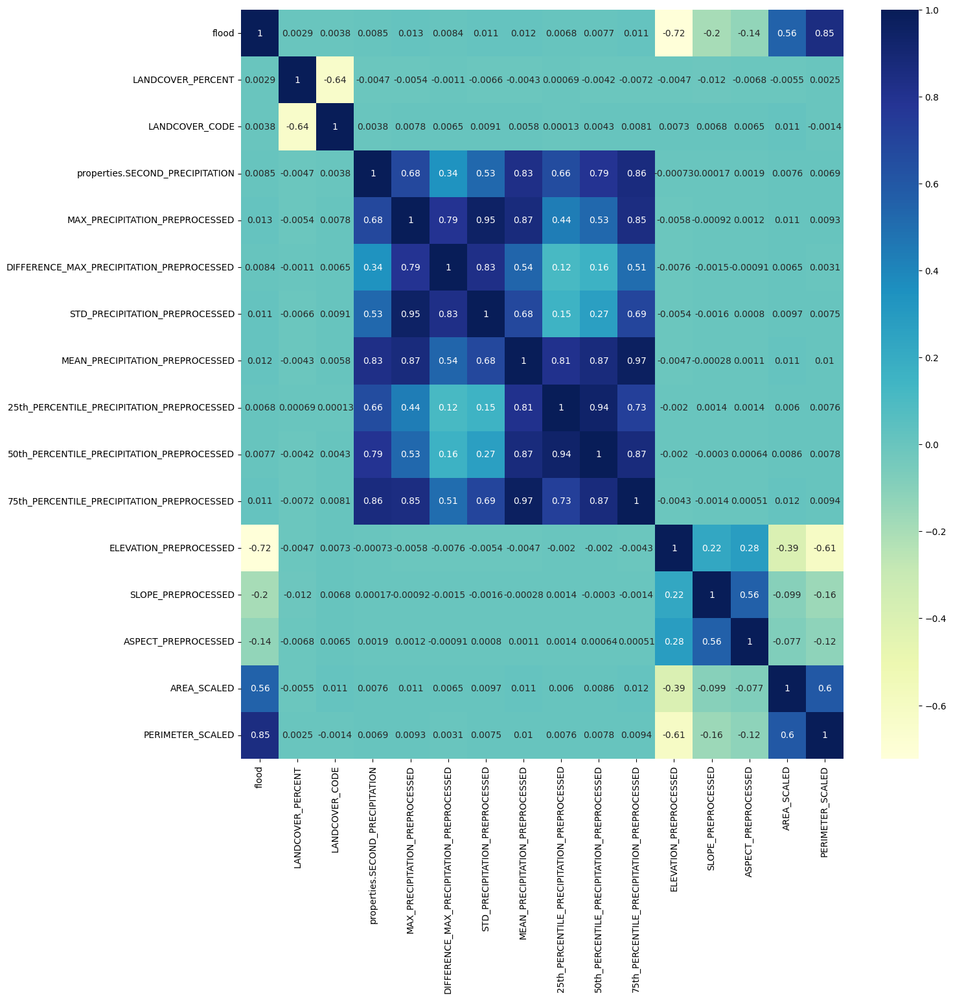

In [ ]:
# Define the subplots
fig, ax = plt.subplots(figsize=(15, 15))

# Generate heatmap using seaborn
sns.heatmap(corr_matrix, annot=True, cmap="YlGnBu",ax=ax)

# Show plot
plt.show()

In [ ]:
# Drop the specified column
PREPROCESSED_DATA = PREPROCESSED_DATA.drop('PERIMETER_SCALED',axis=1)

### 2. SPLITTING THE DATA

Splitting the data intro training and testing first, then splitting the training into training and validation

In [ ]:
# Split the data into training and testing sets (80% and 20%, respectively)
X_train_val, X_test, y_train_val, y_test = train_test_split(PREPROCESSED_DATA.drop(['flood'], axis=1), PREPROCESSED_DATA['flood'], test_size=0.2, random_state=42)

# Split the training and validation sets (60% and 20%, respectively)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.25, random_state=42)


### 3. TRAINING THE MODEL

In [ ]:
# Create a random forest classifier with 100 trees and a max depth of 3
rf = RandomForestClassifier(n_estimators=100, max_depth=3, random_state=42)

# Train the classifier on the training data
rf.fit(X_train, y_train)
y_pred = rf.predict(X_val)

## **G. Evaluation of the results**

**When evaluating the performance of a classification model, it is important to use multiple metrics.**
* Accuracy measures the overall correctness of the model's predictions. 
* ROC-AUC is a metric that measures the ability of the model to correctly classify positive and negative examples across all possible thresholds. 
* Confusion matrix metrics, such as precision, recall, and F1-score, provide information about the model's performance on specific classes and can help identify where the model is making errors.

In [ ]:
# Get the accuracy on the validation data
acc = rf.score(X_val,y_val)

# Print the accuracy
print("Accuracy:", acc)

Accuracy: 0.9737635171068959


In [ ]:
print(classification_report(y_val, y_pred))

              precision    recall  f1-score   support

           0       0.99      0.96      0.97      5539
           1       0.96      0.99      0.97      5743

    accuracy                           0.97     11282
   macro avg       0.97      0.97      0.97     11282
weighted avg       0.97      0.97      0.97     11282



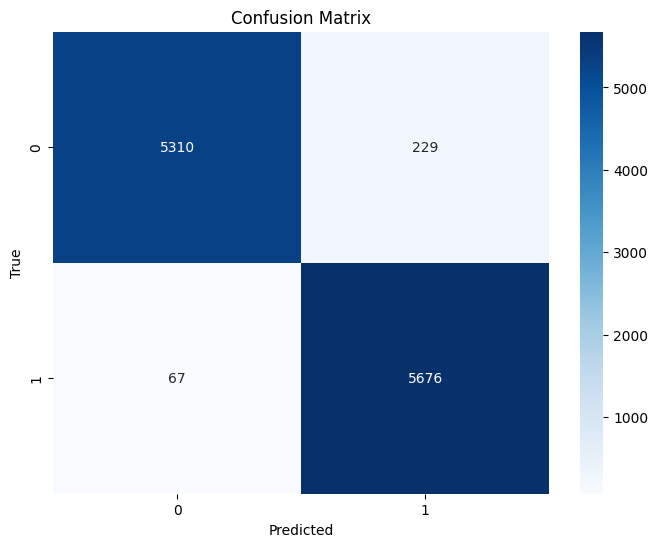

In [ ]:
# Compute the confusion matrix
cm = confusion_matrix(y_val, y_pred)

# Define the class labels
labels = np.unique(np.concatenate((y_val, y_pred)))

# Plot the confusion matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='d', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

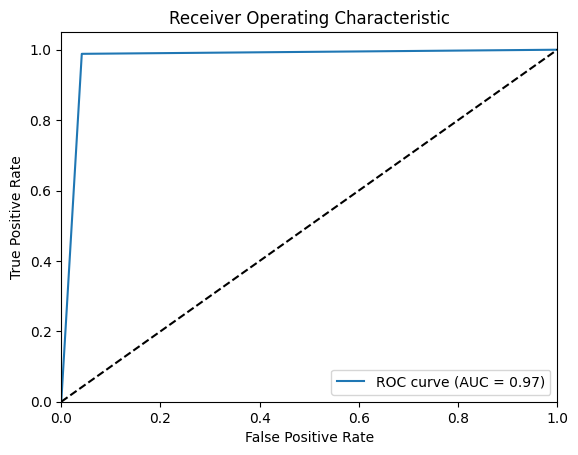

In [ ]:
# Calculate the false positive rate (fpr) and true positive rate (tpr)
fpr, tpr, thresholds = roc_curve(y_val, y_pred)

# Calculate the area under the ROC curve (AUC)
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

## **H. MODEL PREDICTION & VISUALISATION**

STEPS INCLUDED:
1. MODEL PREDICTION ON UNTRAINED DATA
2. VISUALIZATION OF RESULT/PREDICTION

### 1. MODEL PREDICTION 

The untrained test data is used to evaluate the performance of a predictive model on unseen examples. It provides insights into how the model generalizes to new instances and allows for assessing its predictive capabilities.

In [ ]:
# Predict the target variable using the random forest model
y_pred = rf.predict(X_test)

In [ ]:
# Assuming X_test is your test set and y_pred is your predicted values
df_pred = pd.DataFrame({'predicted': y_pred})
df_pred.set_index(X_test.index, inplace=True)
df_pred

,predicted
15691,1
28385,1
16337,1
40406,0
1412,1
...,...
17782,1
30023,0
50140,0
33336,0


In [ ]:
# Join the predicted values with the 'LANDCOVER_CODE' column from X_test
joined_df = df_pred.join(X_test['LANDCOVER_CODE'], how='inner')
# Join the 'LANDCOVER_PERCENT' column from X_test to the joined_df
joined_df = joined_df.join(X_test['LANDCOVER_PERCENT'], how='inner')
# Display the joined dataframe
joined_df

,predicted,LANDCOVER_CODE,LANDCOVER_PERCENT
15691,1,7,3
28385,1,1,53
16337,1,1,53
40406,0,9,5
1412,1,2,7
...,...,...,...
17782,1,2,7
30023,0,1,53
50140,0,1,53
33336,0,9,5


In [ ]:
# Join the GEOMETRY_DATA based on inner join
Final_df = joined_df.join(GEOMETRY_DATA, how='inner')

In [ ]:
# Display the top 5 rows
Final_df.head()

,predicted,LANDCOVER_CODE,LANDCOVER_PERCENT,geometry
15691,1,7,3,MULTIPOLYGON Z (((2528000.257 7361452.583 0.00...
28385,1,1,53,MULTIPOLYGON Z (((2509579.931 7345814.157 0.00...
16337,1,1,53,MULTIPOLYGON Z (((2516782.068 7377616.534 0.00...
40406,0,9,5,MULTIPOLYGON Z (((2510000.000 7420000.000 0.00...
1412,1,2,7,MULTIPOLYGON Z (((2523111.426 7358379.174 0.00...


By taking only one non-flood event and one flood event from the Final_df DataFrame, the code aims to visualize and compare a specific pair of events. This approach allows for a focused and detailed examination of these particular events, providing insights into their spatial distribution and characteristics. By visualizing both a non-flood event and a flood event separately, it becomes easier to identify and analyze the distinguishing features and patterns associated with each event. This visual comparison helps in understanding the impact and extent of flooding in contrast to non-flooded areas, enabling better decision-making and planning for future flood mitigation measures.

In [ ]:
# Find the index of the first occurrence of 0 in the predicted column
non_flood_index = Final_df[Final_df['predicted'] == 0].index[0]

# Store the corresponding row in non_flood_layer_data
non_flood_layer_data = Final_df.loc[[non_flood_index]]

# Find the index of the first occurrence of 1 in the predicted column
flood_index = Final_df[Final_df['predicted'] == 1].index[0]

# Store the corresponding row in flood_layer_data
flood_layer_data = Final_df.loc[[flood_index]]

In [ ]:
# Display the dataframe
non_flood_layer_data

,predicted,LANDCOVER_CODE,LANDCOVER_PERCENT,geometry
40406,0,9,5,MULTIPOLYGON Z (((2510000.000 7420000.000 0.00...


In [ ]:
# Display the dataframe
flood_layer_data

,predicted,LANDCOVER_CODE,LANDCOVER_PERCENT,geometry
15691,1,7,3,MULTIPOLYGON Z (((2528000.257 7361452.583 0.00...


In [ ]:
# Converting to geodataframe
flood_layer_data_df = gpd.GeoDataFrame(flood_layer_data)
non_flood_layer_data_df = gpd.GeoDataFrame(non_flood_layer_data)

Checking if the given geometry is valid or not

In [ ]:
# Check if the geometry is valid
if flood_layer_data_df.geometry.is_valid.any():
    # Create a new GeoDataFrame with the selected row
    flood_layer_data_df = gpd.GeoDataFrame(flood_layer_data_df)

# Check if the geometry is valid
if non_flood_layer_data_df.geometry.is_valid.any():
    # Create a new GeoDataFrame with the selected row
    non_flood_layer_data_df = gpd.GeoDataFrame(non_flood_layer_data_df)

Storing the results in geojson files

In [ ]:
# Saving the results
flood_layer_data_df.to_file('flood.geojson')
non_flood_layer_data_df.to_file('non_flood.geojson')

### 2. VISUALISATION OF RESULTS

To present the results of running the model on untrained data, a dynamic map was created. The map includes multiple layers that provide valuable information related to the independent variables used in the modeling process. These layers can be easily turned on or off, allowing for a comprehensive visualization of the data.

The main layer in the map represents the results of the model, highlighting the predicted flood events and non-flood events. Flood events are typically displayed in blue, while non-flood events are shown in green. This layer provides a visual representation of the model's performance in predicting flood occurrences.

Additionally, independent variables such as land cover types, elevation, and precipitation were incorporated as separate layers in the map. These layers allow for a deeper understanding of the spatial distribution and relationships between these variables and flood events. By toggling these layers on or off, users can explore the influence of different independent variables on flood predictions and observe any potential correlations or patterns.

The interactive nature of the map empowers users to explore the data, gain insights, and make informed decisions based on the visual representation of the model results and independent variables. This visual approach enhances the interpretation of the model's performance and provides a valuable tool for further analysis and decision-making related to flood mitigation and planning.

In [ ]:
# Combine the dataframes
combined_df = pd.concat([flood_layer_data_df,non_flood_layer_data_df])

Get the DEM data layer/tif file for a specific area within the study area

In [ ]:
# Check if the directory exists
if not os.path.exists("VISUALISATION_Data"):
    os.makedirs("VISUALISATION_Data")

# Download the DEM file from the specified URL
_, msg = urllib.request.urlretrieve('https://geonb.snb.ca/downloads2/elevation/2018/dem/aoi1/nb_2018_dem_2500000_7420000.tif', \
                                    "VISUALISATION_Data/Visualisation_DEM.tif")

In order to incorporate a Digital Elevation Model (DEM) into the visualization, the TIFF image file of the DEM was first opened using the Python Imaging Library (PIL). Since Folium, the mapping library being used, requires images in PNG format, the TIFF image was then converted to the RGB format using the `convert` method.

To save the converted image in PNG format, a temporary file was created using the `NamedTemporaryFile` function from the `tempfile` module. This temporary file ensures that the PNG image is saved securely without overwriting any existing files. The `save` method of the PIL Image object was used to save the converted PNG image into the temporary file.

This approach allows for the seamless integration of the DEM data into the visualization map. The PNG image can be easily added as a layer to the map, providing valuable insights into the elevation and topographical features of the area of interest.

In [ ]:
# Open the TIFF image
tiff_image = Image.open('VISUALISATION_Data/Visualisation_DEM.tif')

# Convert TIFF image to PNG format
png_image = tiff_image.convert("RGB")

# Create a temporary file to save the PNG image
temp_file = tempfile.NamedTemporaryFile(suffix=".png", delete=False)
png_image.save(temp_file.name)

CREATING A FOLIUM MAP CENTERED ON NEW BRUNSWICK

In [ ]:
# Create a Folium map centered on New Brunswick, Canada
m = folium.Map(location=[46.5653, -66.4619], zoom_start=7, tiles='CartoDB positron')

CREATING BOUNDING BOX

In [ ]:
# Convert the bounding box to EPSG 4326
bbox = gpd.GeoSeries(box(*get_bounding_box('VISUALISATION_Data/Visualisation_DEM.tif')), crs=non_flood_layer_data_df.crs)
bbox_4326 = bbox.to_crs('EPSG:4326')

# Get the bounding box coordinates in EPSG 4326
bbox_coords = bbox_4326.iloc[0].exterior.coords[:]

# Adjust the map bounds to the bounding box of non_flood_layer_data_df in EPSG 4326
m.fit_bounds([(bbox_coords[0][1], bbox_coords[0][0]), (bbox_coords[2][1], bbox_coords[2][0])])

In [ ]:
bbox = get_bounding_box('VISUALISATION_Data/Visualisation_DEM.tif')
# Create a bounding box polygon from the bbox of non_flood_layer_data_df
bbox_polygon = box(bbox[0], bbox[1], bbox[2], bbox[3])

CREATING & ADDING FLOOD LAYER TO THE MAP

In [ ]:
# Create a feature group for the Flood Event layer
flood_event_layer = folium.FeatureGroup(name='Flood Event')
# Filter the flood_layer_data_df to include only geometries within the bounding box
filtered_flood_data_df = gpd.clip(flood_layer_data_df, bbox_polygon)

# Add the Flood Event GeoDataFrame to the feature group with blue color
folium.GeoJson(filtered_flood_data_df, style_function=lambda x: {'fillColor': 'blue', 'color': 'blue'}).add_to(flood_event_layer)

# Add the Flood Event feature group to the map
flood_event_layer.add_to(m)

CREATING & ADDING NON-FLOOD LAYER TO THE MAP

In [ ]:
# Create a feature group for the Non-Flood Event layer
non_flood_event_layer = folium.FeatureGroup(name='Non-Flood Event')

# Filter the flood_layer_data_df to include only geometries within the bounding box
filtered_non_flood_data_df = gpd.clip(non_flood_layer_data_df, bbox_polygon)

# Add the Non-Flood Event GeoDataFrame to the feature group with green color
folium.GeoJson(filtered_non_flood_data_df, style_function=lambda x: {'fillColor': 'green', 'color': 'green'}).add_to(non_flood_event_layer)

# Add the Non-Flood Event feature group to the map
non_flood_event_layer.add_to(m)


CREATING & ADDING DEM LAYER TO THE MAP

In [ ]:
# Add the PNG image as an overlay in the Folium map
colormap = cm.get_cmap('terrain')

# Create an ImageOverlay layer for the DEM data with the specified parameters and add it to the folium Map object
dem_layer = folium.raster_layers.ImageOverlay(
    image=temp_file.name,
    bounds=[(bbox_coords[0][1], bbox_coords[0][0]), (bbox_coords[2][1], bbox_coords[2][0])],
    opacity=0.95,
    colormap = colormap,
    name='DEM',
    show = False
).add_to(m)

# Close the temporary file
temp_file.close()

CREATING & ADDING LANDCOVER LAYER TO THE MAP

In [ ]:
# Create a feature group for the Non-Flood Event layer
landcover_layer = folium.FeatureGroup(name='LANDCOVER', show=False)

# Define the style function
def style_function(feature):
    landcover_category = feature['properties']['LANDCOVER_CODE']
    
    if landcover_category == 9: #CROPLAND
        return {
            'fillColor': 'lightyellow',
            'fillOpacity': 0.4,
            'color': 'black',
            'weight': 0.2,
        }
    elif landcover_category == 7: #SPARSELY VEFETATED LAND
        return {
            'fillColor': 'lightgreen',
            'fillOpacity': 0.2,
            'color': 'black',
            'weight': 0.2,
        }
    
    elif landcover_category == 5: #Coniferous Forest
        return {
            'fillColor': 'darkgreen',
            'fillOpacity': 0.2,
            'color': 'black',
            'weight': 0.2,  
        } 
    elif landcover_category == 2: #Broadleaf Forest
        return {
            'fillColor': '#D2B48C',
            'fillOpacity': 0.2,
            'color': 'black',
            'weight': 0.2,  
        } 
    elif landcover_category == 1: #Mixed Forest
        return {
            'fillColor': '#00FF00',
            'fillOpacity': 0.2,
            'color': 'black',
            'weight': 0.2,  
        } 
    # Return empty style for all other categories
    return {
        'fillOpacity': 0,
        'color': 'black',
        'weight': 0.2,
    }

# Add the GeoJSON layer to the map
folium.GeoJson(filtered_non_flood_data_df, style_function=style_function).add_to(landcover_layer)
folium.GeoJson(filtered_flood_data_df, style_function=style_function).add_to(landcover_layer)
landcover_layer.add_to(m)

GETTING SOME PRECIPITATION POINTS FOR THE AREA

In [ ]:
# Read the geojson file 
precipitation_layer_data_df = gpd.read_file('PRECIPITATION_RAW.geojson')
# Clip the GeoDataFrame using the bounding box polygon
precipitation_clipped_data_df = gpd.clip(precipitation_layer_data_df , bbox_polygon)

In [ ]:
# Display the top 5 rows
precipitation_clipped_data_df.head()

,id,type,geometry.type,properties.WXO_CITY_CODE,properties.VIRTUAL_STATION_NAME_E,properties.VIRTUAL_STATION_NAME_F,properties.VIRTUAL_CLIMATE_ID,properties.LOCAL_MONTH,properties.LOCAL_DAY,properties.RECORD_PRECIPITATION,...,properties.THIRD_PRECIPITATION_YEAR,properties.FOURTH_PRECIPITATION,properties.FOURTH_PRECIPITATION_YEAR,properties.FIFTH_PRECIPITATION,properties.FIFTH_PRECIPITATION_YEAR,properties.PROVINCE_CODE,properties.RECORD_BEGIN,properties.RECORD_END,properties.IDENTIFIER,geometry
5718,VSNB11V-6-4,Feature,Point,NB-11,OROMOCTO AREA,OROMOCTO,VSNB11V,6,4,63.0,...,1977,20.8,1882,15.5,1951,NB,1871-12-01 00:00:00+00:00,NaT,VSNB11V-6-4,POINT (2501553.568 7426642.735)
5717,VSNB11V-3-13,Feature,Point,NB-11,OROMOCTO AREA,OROMOCTO,VSNB11V,3,13,30.5,...,1993,18.0,1893,17.2,2014,NB,1871-12-01 00:00:00+00:00,NaT,VSNB11V-3-13,POINT (2501553.568 7426642.735)
3799,VSNB11V-6-16,Feature,Point,NB-11,OROMOCTO AREA,OROMOCTO,VSNB11V,6,16,27.9,...,1887,13.7,1967,13.0,1969,NB,1871-12-01 00:00:00+00:00,NaT,VSNB11V-6-16,POINT (2501553.568 7426642.735)
3800,VSNB11V-8-4,Feature,Point,NB-11,OROMOCTO AREA,OROMOCTO,VSNB11V,8,4,45.5,...,2003,24.9,1913,23.4,1995,NB,1871-12-01 00:00:00+00:00,NaT,VSNB11V-8-4,POINT (2501553.568 7426642.735)
3801,VSNB11V-10-4,Feature,Point,NB-11,OROMOCTO AREA,OROMOCTO,VSNB11V,10,4,53.3,...,1980,22.9,1963,21.1,1888,NB,1871-12-01 00:00:00+00:00,NaT,VSNB11V-10-4,POINT (2501553.568 7426642.735)


ADDING & CREATING POINTS FOR RECORD PRECIPITATION

In [ ]:
# Define the shift distance in degrees
shift_distance_lat = 0.0005
shift_distance_lon = 0.0001

# Calculate the number of points
num_points = len(precipitation_clipped_data_df)

# Calculate the side length of the box
side_length = int(num_points ** 0.6) + 1

precipitation_layer = folium.FeatureGroup(name='RECORD_PRECIPITATION',show=False)

# Iterate over each row in the GeoDataFrame
for i, row in precipitation_clipped_data_df.to_crs(4326).iterrows():
    # Get the coordinates of the point
    lon, lat = row['geometry'].x, row['geometry'].y
    
    # Calculate the row and column index in the box formation
    row_index = i % side_length
    col_index = i // side_length
    
    # Calculate the shifted coordinates
    shifted_lat = lat + row_index * shift_distance_lat
    shifted_lon = lon + col_index * shift_distance_lon
    
    folium.Marker(location=[shifted_lat, shifted_lon], popup=row['properties.RECORD_PRECIPITATION']).add_to(precipitation_layer)
    precipitation_layer.add_to(m)

Adding layer control to the map

In [ ]:
# Add the layer control to the map
folium.LayerControl().add_to(m)

Saving the map

In [ ]:
m.save('map.html')

FINAL VISUALISATION RESULTS

In [ ]:
m